In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm, SymLogNorm, TwoSlopeNorm
import matplotlib.colors as colors
import qcodes as qc
import qcodes.instrument_drivers.nplab_drivers as npd
from scipy.optimize import curve_fit
from scipy.interpolate import interp2d, interp1d
from os import path
import colorcet as cc   # install quickly with "conda install colorcet"
from scipy.interpolate import RectBivariateSpline
from matplotlib import ticker
from scipy.ndimage import gaussian_filter
import matplotlib as mpl
from lmfit import Model
import scipy.signal.windows as windows
from matplotlib.lines import Line2D

In [3]:
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['figure.dpi'] = 300
%config InlineBackend.figure_format = 'svg'  # with this, we need to raster the pcolormesh images with rasterized=True
# and save with .svg in the filename. don't worry. The annoying white line/offset in the image doesn't seem to show up if you use dpi=something while saving

In [4]:
# plt.rcParams['font.sans-serif'] = ['Arial',  # make Arial the standard font
#  'DejaVu Sans',
#  'Bitstream Vera Sans',
#  'Computer Modern Sans Serif',
#  'Lucida Grande',
#  'Verdana',
#  'Geneva',
#  'Lucid',
#  'Helvetica',
#  'Avant Garde',
#  'sans-serif']

# plt.rcParams['font.size'] = 12

font = {
                'family': 'Arial',
                'size': 12,
                'serif': 'Times',
                'sans-serif': 'Arial'
            }

plt.rc('font', **font)

In [5]:
# %matplotlib widget

In [6]:
# %matplotlib notebook  # this is what I started out using  # or %matplotlib widget in jupyter lab

In [7]:
cd ..

/Users/robertpolski/Documents/NPGroupResearch/Measurements/Triton/qcodes_data


In [8]:
qc.DataSet.default_io.base_location = path.abspath('.')
figfile = path.abspath('.') + '/Figures/TBGWSe2_HighFieldChernPaper/'

In [9]:
esqh = 1.602e-19**2/6.626e-34
# for the fan plots
boldLW = 1.4
dashes = (3.4, 3) #(6, 5)
bolddashes = (3.4, 3)
oddcolor = tuple(np.array([0, 243, 15])/255)

Arrange the devices in order of twist angle. Look mostly for Rxy since it often looks so good in our devices. But Rxx may suffice

# M20 0.87$^\circ$ area, Rxx only, include this in the supplementary

In [8]:
# electrodes 14-15 on lockin865, 16-21 on lockin830
datafan1415 = qc.load_data('data/2019-11-29/#003_M20_14_15_865and16_45_830_5.9Tto0T_3nA_13.33Hz_11-42-24')

# Taken later to patch the large filling factor up to 4 (but only to 4T)
dfan1415_2 = qc.load_data('data/2019-12-28/#004_M20_14_15_865and16_21_830_4to0T_3nA_3.9to5Vgate_15-31-20')

In [9]:
Rxx1415 = npd.Rxxfromdata(datafan1415, 3e-9, 'lockin865')
Rxx1415_right = npd.Rxxfromdata(dfan1415_2, 3e-9, 'lockin865')
gfan1415 = datafan1415.srframe_volt_p1_set[0, :]
gfan1415_right = dfan1415_2.srframe_volt_p1_set[:]
fieldsfan1415 = datafan1415.triton_field_set_stable_set[:]
fieldsfan1415_right = dfan1415_2.triton_field_set_stable_set[:]
Rxx1621 = npd.Rxxfromdata(datafan1415, 3e-9, 'lockin830')
gfan1621 = datafan1415.srframe_volt_p1_set[0, :]
fieldsfan1621 = datafan1415.triton_field_set_stable_set[:]

In [10]:
gfan1415_tot = np.concatenate((gfan1415, gfan1415_right[0, 16:]))
Rxx1415_tot = np.hstack((Rxx1415[38:, :], Rxx1415_right[:, 16:]))
Rxx1415_totcorr = np.copy(Rxx1415_tot)
Rxx1415_totcorr[Rxx1415_tot <= 0] = np.min(np.abs(Rxx1415_tot))

In [11]:
Rxx1415_2 = np.copy(Rxx1415)
Rxx1415_2[Rxx1415_2 <= 0] = np.min(np.abs(Rxx1415_2))

In [12]:
sl, b = (17.114662857569453, -4.428590161024674)
V0 = -b/sl
C = sl*1.602e-19**2/6.626e-34
dbn = 8.85e-12*3/C
print('effective capacitance: {:.4e}'.format(C))
print('effective hBN thickness: {:.1f} nm'.format(dbn*10**9))
print('V0: {}'.format(V0))

effective capacitance: 6.6289e-04
effective hBN thickness: 40.1 nm
V0: 0.25876000000000016


There is a slight inconsistency here. If we use the electron half-filling intercept, we get 0.87 deg, and if we use the full filling, we get 0.88. It's not too big of a deal, and the half-filling intercept is easier to extract, so we can use that.

In [13]:
slhalf, bhalf = (17.99913656084725, -42.752452614655176)
V0half = -bhalf/slhalf  # redo this now... # The lines at the full filling didn't match up well unless I subtracted 0.1 from the full-filling gate voltage, so this should give us the proper angle
Vgatefull = (V0half - V0)*2
print('Full filling voltage difference: {}'.format(Vgatefull))
nfull = (Vgatefull)*C/1.602e-19/10**4
print(nfull/10**12) #10**12 cm^-2
a = 0.246e-9

theta = np.sqrt(np.sqrt(3)*nfull*10**4*a**2/8)*180/np.pi
print('theta: ', theta)

Full filling voltage difference: 4.232980388741174
1.7515626870221186
theta:  0.8679723732082049


In [15]:
V0half

2.375250194370587

In [16]:
filling1415 = np.interp(gfan1415, [V0 - Vgatefull*5/4, V0 + Vgatefull*5/4], [-5, 5])
filling1415_tot = np.interp(gfan1415_tot, [V0 - Vgatefull*6/4, V0 + Vgatefull*6/4], [-6, 6])

In [17]:
[V0 - Vgatefull, V0 + Vgatefull]

[-3.974220388741174, 4.491740388741174]

In [18]:
# the 1.05T peak matches with the 1.00T peak, so delete that row

In [19]:
indices = [i != 59 for i in range(len(fieldsfan1415))]  # delete the 1.05T line
Rxx1415func = RectBivariateSpline(filling1415, fieldsfan1415[indices][::-1], np.flip(Rxx1415_2[indices, :], axis=0).T)

([<matplotlib.axis.YTick at 0x7fb73cc14b10>,
 <a list of 7 Text yticklabel objects>)

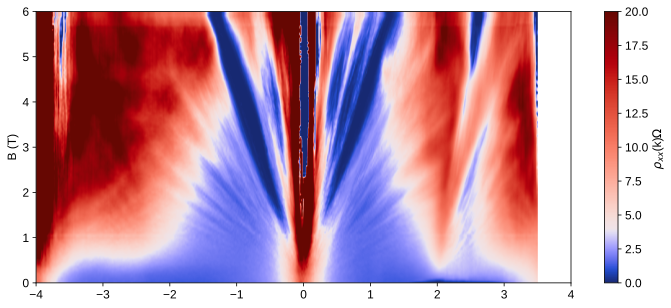

In [20]:
x = np.linspace(-4, 3.5, 1201)
y = np.linspace(0, 6, 901)
Rxx1415int = gaussian_filter(Rxx1415func(x, y).T, (0.9, 0.9))
plt.figure(figsize=(12, 5))
plt.pcolormesh(x, y, Rxx1415int/1000, norm=TwoSlopeNorm(4, 0, 20), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label=r'$\rho$' +'$_{xx}$ (k$\Omega$)')
# plt.xlabel(r'$\nu$')
plt.ylabel('B (T)')
plt.xlim((-4, 4))
plt.xticks(range(-4, 5))
plt.yticks(range(7))
# plt.savefig(figfile + 'M20_0p87fan_to6T_filling_linear.svg', dpi=300, bbox_inches='tight')

## Try fitting the nu=2 gap

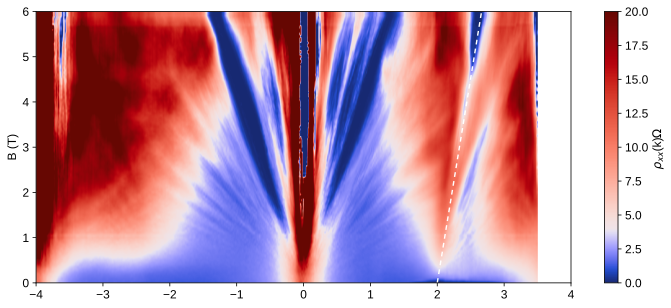

In [330]:
Vgatefull = 4.232980388741174
slfill = 17.114662857569453*Vgatefull/4

x = np.linspace(-4, 3.5, 1201)
y = np.linspace(0, 6, 901)
Rxx1415int = gaussian_filter(Rxx1415func(x, y).T, (0.9, 0.9))
plt.figure(figsize=(12, 5))
plt.pcolormesh(x, y, Rxx1415int/1000, norm=TwoSlopeNorm(4, 0, 20), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label=r'$\rho$' +'$_{xx}$ (k$\Omega$)')
# plt.xlabel(r'$\nu$')
plt.ylabel('B (T)')
plt.xlim((-4, 4))
plt.xticks(range(-4, 5))
plt.yticks(range(7))

Bl = 6
Bs = 0

nuhalfp = 2
b = -nuhalfp*slfill
i = 2
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

4.6733668341708565


(-0.2, 10)

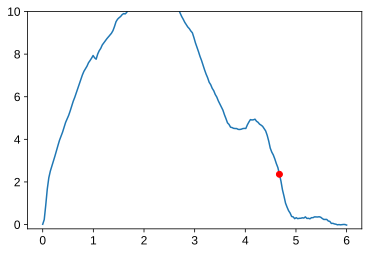

In [331]:
ymin, ymax = -0.2, 10
xmin, xmax = 0, 8

Bl = 6
Bs = 0

def linecut(nuint, slope):
    "put in the xintercept (in nu) and slope (integer corresponding to C)"
    b = -nuint*slfill
    i = slope
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 200)
    B = (x*slfill + b)/i
    cutRxx = np.zeros(len(B))
    for i in range(len(B)):
        cutRxx[i] = Rxx1415func(x[i], B[i])/1000
        
    return B, cutRxx

def cutoffB(B, cutRxx, dropoffval=2, beginning=-1):
    cutoff = 8
    indx = -1
    baseline = np.average(cutRxx[beginning-8:beginning])
    for i in range(len(B)):
        indx = beginning - i
        if (cutRxx[indx] - baseline) > dropoffval:
            cutoff = B[indx]
            break
    print(cutoff)
    return cutoff, indx

def plotcutoff(B, cut, label, dropoffval=2, beginning=-1):
    plt.plot(B, cut, label=label)
    cutoff, indx = cutoffB(B, cut, dropoffval=dropoffval, beginning=beginning)
    plt.plot(B[indx], cut[indx], 'or')

B1, cut1 = linecut(2, 2)

plt.figure()
# plt.plot(B1, cut1)
plotcutoff(B1, cut1, 320, beginning=-20)
plt.ylim(ymin, ymax)
# plt.hlines(320, 0, 6)

# M20 0.83$^\circ$ area

In [677]:
dp83 = qc.load_data('data/2019-12-05/#007_M20_865_21-45_830_16-45_Rxy_twodfan_0p5nA_22-32-09')
gp83 = dp83.srframe_volt_p1_set[0, :]
bp83 = dp83.triton_field_set_stable_set[40:]  # only from 5T down
Rp83 = npd.Rxxfromdata(dp83, 0.5e-9, 'lockin865')[40:, :]

# some data to 7T (actually -7T, so it may not line up well. We'll see)
dp83_2 = qc.load_data('data/2019-12-08/#002_M20_865_16-15_830_16-45_Rxy_twodfan_0p5nA_ton7T_16-49-13')
gp83_2 = dp83_2.srframe_volt_p1_set[0, :]
bp83_2 = dp83_2.triton_field_set_stable_set[50:]*-1  #from 5-7T
Rp83_2 = npd.Rxxfromdata(dp83_2, 0.5e-9, 'lockin865')[50:, :]

bp83_full = np.concatenate((bp83[::-1], bp83_2))
Rp83_full = np.vstack((np.flip(Rp83, axis=0), Rp83_2))

In [678]:
sl0 = 16.992629165630916 
V0 = 0.296
V0h = 2.265

Vgatefull = (V0h - V0)*2
C = sl0*1.602e-19**2/6.626e-34
dbn = 8.85e-12*3/C
print('effective capacitance: {:.4e}'.format(C))
print('effective hBN thickness: {:.1f} nm'.format(dbn*10**9))
print('V0: {}'.format(V0))
print('Full filling voltage difference: {}'.format(Vgatefull))
nfull = (Vgatefull)*C/1.602e-19/10**4
print(nfull/10**12) #10**12 cm^-2
a = 0.246e-9

theta = np.sqrt(np.sqrt(3)*nfull*10**4*a**2/8)*180/np.pi
print('theta: ', theta)

effective capacitance: 6.5816e-04
effective hBN thickness: 40.3 nm
V0: 0.296
Full filling voltage difference: 3.938
1.61788396912339
theta:  0.8341933925864526


In [679]:
nugatep83 = np.interp(gp83, [V0 - Vgatefull*6/4, V0 + Vgatefull*6/4], [-6, 6])

In [680]:
Rp83corr = np.copy(Rp83)
Rp83corr[Rp83 <= 0] = np.min(np.abs(Rp83[Rp83 > 0]))

In [681]:
indices_full = [i != 21 for i in range(len(bp83_full))]  # delete 1.05 and interpolate
Rp83_fullfunc = RectBivariateSpline(nugatep83, bp83_full[indices_full], Rp83_full[indices_full, :].T, kx=1, ky=1)

(0, 7)

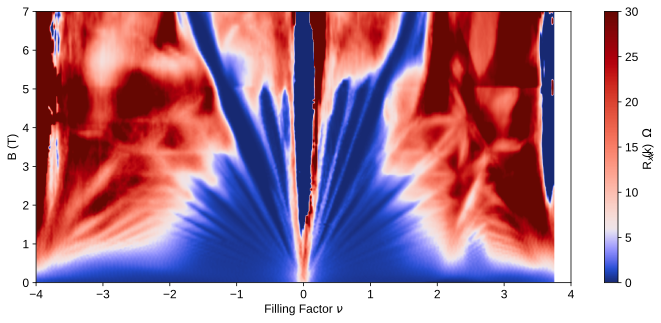

In [682]:
x = np.linspace(-4.1, 3.75, 1000)
y = np.linspace(0, 7, 1000)
cdivlog = TwoSlopeNorm(vmin=0, vcenter=6, vmax=30000/1000)
plt.figure(figsize=(12, 5))
plt.pcolormesh(x, y, gaussian_filter(Rp83_fullfunc(x, y).T, (1, 1))/1000, norm=cdivlog, cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel('Filling Factor $\\nu$')
plt.ylabel('B (T)')
plt.xlim((-4, 4))
plt.ylim((0, 7))

0.8384399198162514


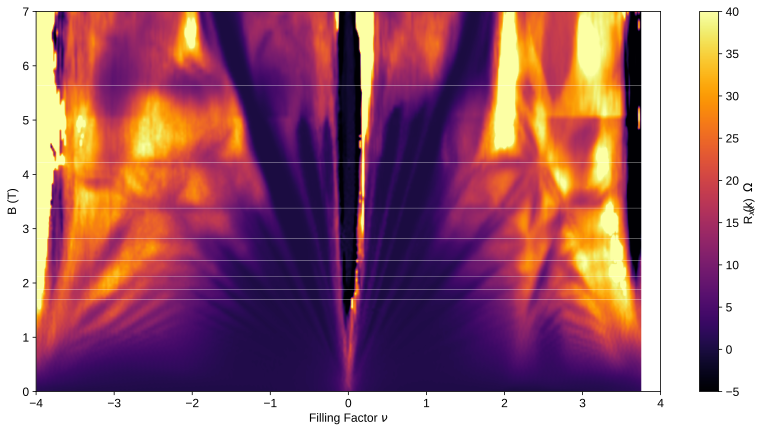

In [697]:
x = np.linspace(-4.1, 3.75, 1000)
y = np.linspace(0, 7, 1000)
cdivlog = TwoSlopeNorm(vmin=0, vcenter=6, vmax=30000/1000)
plt.figure(figsize=(14, 7))
plt.pcolormesh(x, y, gaussian_filter(Rp83_fullfunc(x, y).T, (1, 1))/1000, vmin=-5, vmax=40, cmap='inferno', rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel('Filling Factor $\\nu$')
plt.ylabel('B (T)')
plt.xlim((-4, 4))
plt.ylim((0, 7))

# Brown-Zac oscillations
B0 = 16.9
# From B0, calculate the angle from the associated moire area
A = 6.626e-34/1.602e-19/B0
theta = np.sqrt(np.sqrt(3)/2*0.246e-9**2/A)*180/np.pi
print(theta)

fracs = np.array([1/3, 1/4, 1/5, 1/6, 1/7, 1/8, 1/9, 1/10])
plt.hlines(phi0*fracs, -4, 4, lw=0.3, color='w')

# M20 0.79$^\circ$ area, Rxy (note that these electrodes are between 0.83$^\circ$ and 0.79$^\circ$ (Rxx can go in the supplementary)

## Rxx

In [698]:
# Run the first two cells of the 0.87 deg area for these to work

Rxx1621_2 = np.copy(Rxx1621)
Rxx1621_2[Rxx1621_2 <= 0] = np.min(np.abs(Rxx1621_2[Rxx1621 > 0]))

In [699]:
sl, b = (16.992629165630916, -4.454275668221137)
V0 = -b/sl
C = sl*1.602e-19**2/6.626e-34
dbn = 8.85e-12*3/C
print('effective capacitance: {:.4e}'.format(C))
print('effective hBN thickness: {:.1f} nm'.format(dbn*10**9))
print('V0: {}'.format(V0))

effective capacitance: 6.5816e-04
effective hBN thickness: 40.3 nm
V0: 0.26212986965138396


In [700]:
slfull, bfull = (-19.73450247935806, 74.15691506286662)
V0full = -bfull/slfull
Vgatefull = V0full - V0  # This one was a bit uneven, so the negative side full filling didn't line up perfectly (it was slightly closer to the CNP), but this seems close enough
print('Full filling voltage difference: {}'.format(Vgatefull))
nfull = (Vgatefull)*C/1.602e-19/10**4
print(nfull/10**12) #10**12 cm^-2
a = 0.246e-9

theta = np.sqrt(np.sqrt(3)*nfull*10**4*a**2/8)*180/np.pi
print('theta: ', theta)

Full filling voltage difference: 3.495599272009696
1.4361284978831588
theta:  0.7859405741943927


In [701]:
filling1621 = np.interp(gfan1621, [V0 - Vgatefull*6/4, V0 + Vgatefull*6/4], [-6, 6])

In [702]:
indices = [i != 97 for i in range(len(fieldsfan1621))]  # delete 1.05T and interpolate (glitch in 1.05T)

In [703]:
Rxx1621func = RectBivariateSpline(filling1621, fieldsfan1621[indices][::-1], np.flip(Rxx1621_2[indices, :], axis=0).T, kx=1, ky=1)

Up to 6 T

Text(0, 0.5, 'B (T)')

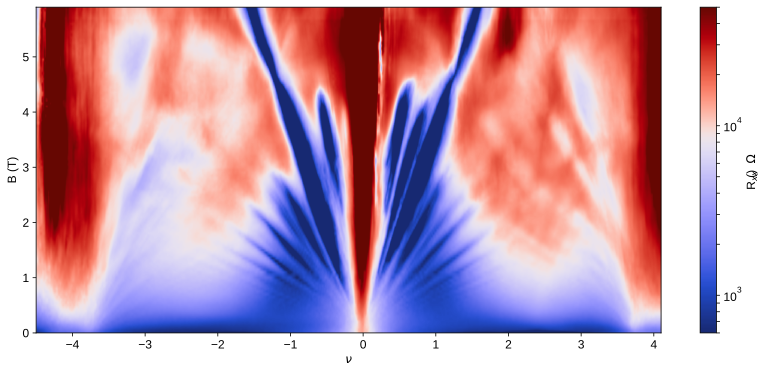

In [704]:
x = np.linspace(-4.5, 4.1, 1200)
y = np.linspace(0, 5.9, 1200)
cdivlog = npd.DivLogNorm(0.6, 600, 50000)
Rxx1621int = gaussian_filter(Rxx1621func(x, y).T, (1.1, 1.1))
plt.figure(figsize=(14, 6))
plt.pcolormesh(x, y, Rxx1621int, norm=cdivlog, cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(ticks=ticker.LogLocator(subs=range(10)), format=ticker.LogFormatterMathtext(), label='R$_{xx}$ ($\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('B (T)')
# plt.xlim((-4, 4))
# plt.savefig(figfile + 'M20_0p79deg_fanto6TRxx_log.svg', dpi=300, bbox_inches='tight')

Text(0, 0.5, 'B (T)')

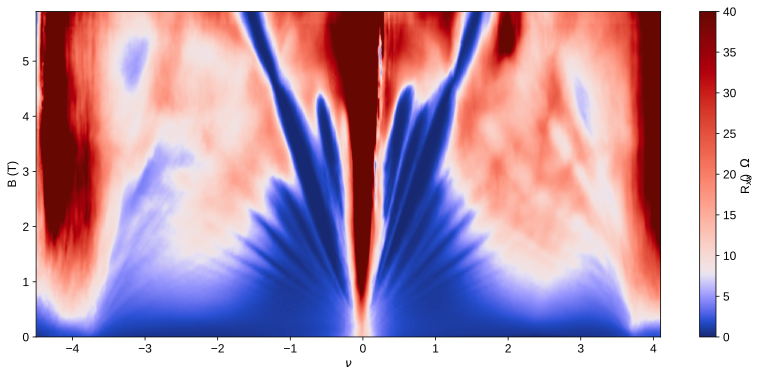

In [705]:
x = np.linspace(-4.5, 4.1, 1200)
y = np.linspace(0, 5.9, 1200)
cdivlog = npd.DivLogNorm(0.6, 600, 50000)
Rxx1621int = gaussian_filter(Rxx1621func(x, y).T, (1.1, 1.1))
plt.figure(figsize=(14, 6))
plt.pcolormesh(x, y, Rxx1621int/1000, norm=TwoSlopeNorm(8, 0, 40), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar( label='R$_{xx}$ ($\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('B (T)')
# plt.xlim((-4, 4))
# plt.savefig(figfile + 'M20_0p79deg_fanto6TRxx_linear.svg', dpi=300, bbox_inches='tight')

0.8029609862044658


(-4, 4)

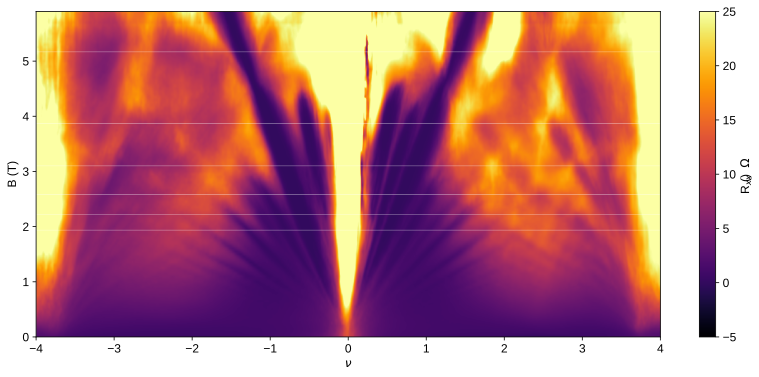

In [718]:
x = np.linspace(-4.5, 4.1, 1200)
y = np.linspace(0, 5.9, 1200)
Rxx1621int = gaussian_filter(Rxx1621func(x, y).T, (1.1, 1.1))
plt.figure(figsize=(14, 6))
plt.pcolormesh(x, y, Rxx1621int/1000, vmin=-5, vmax=25, cmap='inferno', rasterized=True)
plt.colorbar( label='R$_{xx}$ ($\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('B (T)')

B0 = 15.5
theta = np.sqrt(np.sqrt(3)/2*0.246e-9**2*B0*1.602e-19/6.626e-34)*180/np.pi
print(theta)
fracs = np.array([1/3, 1/4, 1/5, 1/6, 1/7, 1/8])
plt.hlines(fracs*B0, -4, 4, lw=0.3, color='w')

plt.xlim((-4, 4))
# plt.savefig(figfile + 'M20_0p79deg_fanto6TRxx_linear.svg', dpi=300, bbox_inches='tight')

## Rxy

In [97]:
drxy1645 = qc.load_data('data/2019-12-05/#007_M20_865_21-45_830_16-45_Rxy_twodfan_0p5nA_22-32-09') # note here that at 5T down, 21-45 was switched to 15-16 (Rxx of the 0.83 degree area)

Rxy1645 = drxy1645.lockin830_X[:, :]/0.5e-9
gxy1645 = drxy1645.srframe_volt_p1_set[0, :]
Bxy1645 = drxy1645.triton_field_set_stable_set[:]

In [98]:
esqh = 1.602e-19**2/6.626e-34

In [99]:
Vgatefull = 3.888
V0 = 0.296
nuxy1645 = np.interp(gxy1645, [V0 - 6/4*Vgatefull, V0 + 6/4*Vgatefull], [-6, 6])

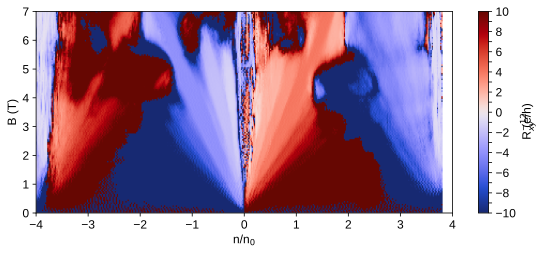

In [119]:
plt.figure(figsize=(8, 3.7))
plt.pcolormesh(nuxy1645, Bxy1645, -1/(Rxy1645 + 0.0001)/esqh, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(0, -10, 10), rasterized=True)
c = plt.colorbar(label='R$_{xy}^{-1}$ (e$^2$/h)', ticks=plt.MultipleLocator(1))
for label in c.ax.get_yticklabels()[1::2]:
    label.set_visible(False)
plt.xlabel('n/n$_0$')
plt.ylabel('B (T)')
plt.xlim((-4, 4))
plt.tight_layout()
# plt.savefig(figfile + 'M20_0p79_0p83_invRxyLandaufan_fillingfactor.svg', bbox_inches='tight', dpi=300)

# M08 0.97$^\circ$ device, with Rxx and Rxy

In [9]:
#Rxx was 38-37, Rxy was 38-44

datafan3837 = qc.load_data('data/2019-10-06/#003_0to8TtwodSweep_0.5nAexcM08_Rxx38-37_Rxy38-44_basetemp_161fieldpts_16-35-30')

Rxx3837 = npd.Rxxfromdata(datafan3837, 0.5e-9, instrument='lockin865')[:, 16:]
Rxy3844 = npd.Rxxfromdata(datafan3837, 0.5e-9, instrument='lockin830')[:, 16:]
sigmaxy3844 = -Rxy3844/(Rxy3844**2 + Rxx3837**2)
gfan3837 = datafan3837.srframe_volt_p1_set[0, 16:]
fieldsfan3837 = datafan3837.triton_field_set_stable_set[:]

Convert Vbg to filling factor (-4 to 4)

In [10]:
sl, b = (-11.09489539598033, 3.831927327596076)
C = -sl*1.602e-19**2/6.626e-34
dBN = 3*8.85e-12/C
V0 = -b/sl
print('effective capacitance: {:.4e}'.format(C))
print('effective hBN thickness: {:.1f} nm'.format(dBN*10**9))
V0 -= 0.015
print('V0: ', V0)

effective capacitance: 4.2973e-04
effective hBN thickness: 61.8 nm
V0:  0.33037750837960844


In [11]:
slf, bf = (-11.684640404016196, -90.57221927031419)
V0fullh = -bf/slf
Vgatefull = V0-V0fullh
print('Full filling voltage difference: {}'.format(Vgatefull))
nfull = (V0 - V0fullh)*C/1.602e-19/10**4
print(nfull/10**12) #10**12 cm^-2
a = 0.246e-9

theta = np.sqrt(np.sqrt(3)*nfull*10**4*a**2/8)*180/np.pi
print('theta: ', theta)

Full filling voltage difference: 8.081768748385855
2.167907319080984
theta:  0.9656359268823933


In [12]:
filling3837 = np.interp(gfan3837, [V0 - Vgatefull*5/4, V0 + Vgatefull*5/4], [-5, 5])

## Rxx

In [12]:
corrRxx3837 = np.copy(Rxx3837)
corrRxx3837[corrRxx3837 <= 0] = np.min(np.abs(corrRxx3837))

indices = [i not in (21, 22) for i in range(len(fieldsfan3837))]  # deleting 1.05, 1.10 T since the glitch happened
Rxx3837func = RectBivariateSpline(filling3837[:-24][::-1], fieldsfan3837[indices], np.flip(corrRxx3837[indices, :-24], axis=1).T, kx=1, ky=1)

In [13]:
x = np.linspace(-5, 4.85, 1001)
y = np.linspace(0, 8, 1201)
Rxx3837int = gaussian_filter(Rxx3837func(x, y), (1.2, 1.2)).T

fig, ax = plt.subplots(figsize=(13, 6))
p = ax.pcolormesh(x, y, Rxx3837int/1000, norm=npd.DivLogNorm(0.6, vmin=100/1000, vmax=2e5/1000), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
cb = plt.colorbar(p, ticks=ticker.LogLocator(subs=range(10)), ax=ax,  format=ticker.LogFormatterMathtext(), label=r'$\rho$'+'$_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('$\mu_0$ H (T)')
# plt.savefig(figfile + 'M08_0p97fan_to8T_log.svg', dpi=300, bbox_inches='tight')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Text(0, 0.5, '$\\mu_0$ H (T)')

In [19]:
x = np.linspace(-5, 4.85, 1001)
y = np.linspace(0, 8, 1201)
Rxx3837int = gaussian_filter(Rxx3837func(x, y), (1.2, 1.2)).T

fig, ax = plt.subplots(figsize=(9, 3.7))
p = ax.pcolormesh(x, y, Rxx3837int/1000, norm=TwoSlopeNorm(5000/1000, vmin=0, vmax=0.6e5/1000), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
cb = plt.colorbar(p, ax=ax, label='R$_{xx}$ (k$\Omega$)')
plt.xlabel('n/n$_0$')
plt.ylabel('B (T)')
plt.xlim(-4, 4)
plt.tight_layout()
# plt.savefig(figfile + 'M08_0p97fan_to8T_linear.svg', dpi=300, bbox_inches='tight)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [206]:
x = np.linspace(-5, 4.85, 1001)
y = np.linspace(0, 8, 1201)
Rxx3837int = gaussian_filter(Rxx3837func(x, y), (1, 1)).T
fig, ax = plt.subplots(figsize=(9, 3.7))
norm = TwoSlopeNorm(vmin=0, vcenter=4500/1000, vmax=8e4/1000)
p = ax.pcolormesh(x, y, Rxx3837int/1000, norm=norm, cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
cb = plt.colorbar(p, ax=ax, label='R$_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('B (T)')
plt.ylim((0, 8))
plt.yticks(range(9))
# plt.xticks(range(-4, 5), [])
plt.xlim((-4, 4))
plt.tight_layout()

sl, b = (11.09489539598033, 0)
Vgatefull = 8.081768748385855
slfill = sl*Vgatefull/4

def plotline(slope, xintercept, Bl, Bs, *args, **kwargs):
    "Note that slope is actually 1/(actual slope)"
    b = -xintercept*slfill
    x = np.linspace((Bs*slope - b)/slfill, (Bl*slope - b)/slfill, 5)
    plt.plot(x, (x*slfill + b)/slope, *args, **kwargs)

# new set of lines
Bl = 7.8
Bs = 3.1
LW = 1.3
dashes = (3.4, 3) #(6, 5)
bolddashes = (3.4, 3)
oddcolor = tuple(np.array([0, 243, 15])/255)

## CNP
# first the main sequence
slopes = [-26, -22, -18, -14, -12, -10, -8, -6, -4, -2, 2, 4, 6, 8, 10, 12, 14, 16, 18, 22, 26, 30, 34, 38]
Bls = [1.7, 2, 2.5, 3.3, 4, 5, 5.8, 7, 7.8, 7.8, 7.8, 7.8, 5, 3.2, 2.8, 2.2, 2, 1.8, 1.8, 1.5, 0.9, 1.1, 0.8, 0.9]
Bs = [0.6, 0.6, 0.6, 1, 0.6, 1.2, 0.7, 0.7, 1.6, 2.5, 2.5, 2.5, 2.3, 1.5, 1, 1.7, 0.8, 1.3, 0.6, 0.6, 0.7, 0.8, 0.65, 0.65]
LW = 0.7

for i in range(len(slopes)):
    plotline(slopes[i], 0, Bls[i], Bs[i], 'k', lw=LW)

# lesser sequence CNP
slopes = [-7, -5, -3, -3, -1, 3, 5, 5, 7, 9]
Bls = [6.7, 7.8, 5.3, 7.8, 7.8, 7.8, 2.8, 7.5, 3.5, 3]
Bs = [2.5, 2.5, 3.6, 6.3, 2, 2, 1.6, 4, 1.2, 2]
LW = 0.6

for i in range(len(slopes)):
    plotline(slopes[i], 0, Bls[i], Bs[i], color='gray', lw=LW)
    

# + quarter filling
V0q = 0.97
Bls = [6]
Bs = [3]
slopes = [4]

for i in range(len(slopes)):
    plotline(slopes[i], V0q, Bls[i], Bs[i], lw=0.7, color='r', dashes=dashes)    

# + Half filling
Bs = 1
V0half = 2-0.03
Bls = [5.3, 5, 3, 2, 1.8]
Bs = [2, 1.4, 1.1, 0.9, 0.9]
slopes = [3, 4, 6, 8, 10]

for i in range(len(slopes)):
    plotline(slopes[i], V0half, Bls[i], Bs[i], lw=0.7, color='b', dashes=dashes)
    
    
# - Half filling
Bl = 7.8
Bs = 2
V0halfn = -1.95
Bls = [3.5, 5, 7]
slopes = [-8, -6, -4]

for i in range(len(slopes)):
    plotline(slopes[i], V0halfn, Bls[i], Bs, lw=0.7, color='b', dashes=dashes)
    
# Chern states
plotline(-2, -2, 6.3, 0, lw=1.2, color='b', dashes=bolddashes)
plotline(-3, -1, 7.4, 0, lw=1.2, color='r', dashes=bolddashes)
plotline(3, 1, 3.9, 0, lw=1.2, color='r', dashes=bolddashes)
plotline(2, 2, 2, 0, lw=1.2, color='b', dashes=bolddashes)
plotline(1, 3, 3.2, 0, lw=1.2, color='g', dashes=bolddashes)

plt.tight_layout()

plt.xlim(-4, 4)
plt.ylim(0, 8)

# plt.savefig(figfile + 'M08_0p97fan_to8T_withlines.svg', bbox_inches='tight', dpi=300)

/Users/robertpolski/anaconda/envs/qcodes/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

## Trying to fit SdH oscillations

In [168]:
N = 1000
nupts = np.linspace(0.25, 1.1, 11)
Binitialpts = np.linspace(0, 5, N)
nupts = np.linspace(0.25, 1.1, 15)
Rarr = gaussian_filter(Rxx3837func(nupts, Binitialpts).T/1000, (1, 1))
npts = 1000
Binmin, Binmax = 0.25, 4
invBpts = np.linspace(Binmin, Binmax, npts)
d = invBpts[1] - invBpts[0]
Bpts = 1/invBpts
plt.figure()
for i in range(len(nupts)):
    R = np.interp(Bpts, Binitialpts, Rarr[:, i])
    pfit = np.polyfit(invBpts, R, 5)
    Rcorr = R - np.polynomial.polynomial.polyval(invBpts, pfit[::-1])
#     plt.plot(invBpts, Rcorr)
    fft = np.fft.fft(Rcorr)[:int(npts/2)]
    freqs = np.fft.fftfreq(npts, d)[:int(npts/2)]
    plt.plot(freqs, np.abs(fft)/np.sum(np.abs(fft)) + 0.02*i)

plt.xlim(0, 30)
# print(d)

/Users/robertpolski/anaconda/envs/qcodes/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

(0, 30)

## Rxy

In [313]:
indices = [i not in (21, 22) for i in range(len(fieldsfan3837))]  # deleting 1.05, 1.10 T since the glitch happened
invRxy3844func = RectBivariateSpline(filling3837[:-24][::-1], fieldsfan3837[indices], -1/np.flip((Rxy3844[indices, :-24] + 0.001), axis=1).T/esqh, kx=1, ky=1)

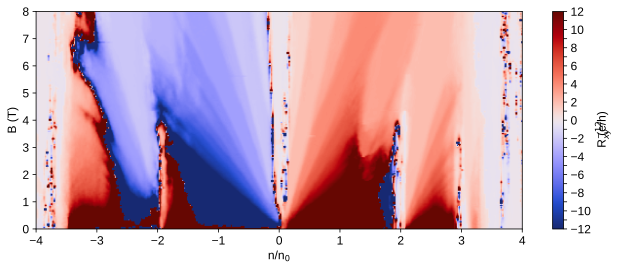

In [319]:
x = np.linspace(-4, 4, 500)
y = np.linspace(0, 8, 200)

plt.figure(figsize=(9, 3.7))
plt.pcolormesh(x, y, invRxy3844func(x, y).T, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(0, -12, 12), rasterized=True)
c = plt.colorbar(label='R$_{xy}^{-1}$ (e$^2$/h)', ticks=plt.MultipleLocator(1))
for label in c.ax.get_yticklabels()[1::2]:
    label.set_visible(False)
plt.tight_layout()
plt.xlabel('n/n$_0$')
plt.ylabel('B (T)')
plt.xlim(-4, 4)
# plt.savefig(figfile + 'M08_0p97_invRxyFanto8T.svg', dpi=300, bbox_inches='tight')

## Determination of the Chern band minimum fields

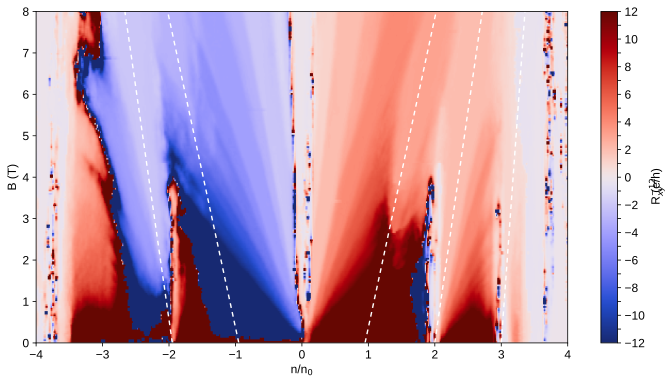

In [314]:
sl = 11.09489539
Vgatefull = 8.081768748385855
slfill = sl*Vgatefull/4

x = np.linspace(-4, 4, 500)
y = np.linspace(0, 8, 200)

plt.figure(figsize=(10, 5.5))
plt.pcolormesh(x, y, invRxy3844func(x, y).T, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(0, -12, 12), rasterized=True)

Bl = 8
Bs = 0

nuhalfn = -1.95
b = -nuhalfn*slfill
i = -2
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuqn = -0.95
b = -nuqn*slfill
i = -3
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuqp = 0.95
b = -nuqp*slfill
i = 3
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuhalfp = 2
b = -nuhalfp*slfill
i = 2
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuthreep = 3
b = -nuthreep*slfill
i = 1
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)


c = plt.colorbar(label='R$_{xy}^{-1}$ (e$^2$/h)', ticks=plt.MultipleLocator(1))
for label in c.ax.get_yticklabels()[1::2]:
    label.set_visible(False)
plt.xlabel('n/n$_0$')
plt.ylabel('B (T)')
plt.xlim(-4, 4)
plt.tight_layout()



In [515]:
def cutoffB(B, R, val, beginning=-1, dropoff=0.15):
    """ the point at which the value drops 15% (or dropoff) from the quantized value val. You can provide the beginning index.
    Assumes that B is ascending.
    Use < for lessthan and greater for > in the comparison"""
    cutoff = 8
    indx = -1
    for i in range(len(B)):
        indx = beginning - i
        if np.abs(R[indx] - val)/np.abs(val) > dropoff:
            cutoff = B[indx]
            break
    return cutoff, indx

2.4522613065326624
6.030150753768846
3.6582914572864333
0.8844221105527659
1.5678391959799


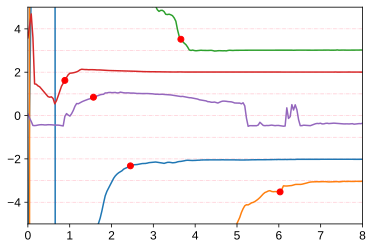

In [531]:
ymin, ymax = -5, 5
xmin, xmax = 0, 8

Bl = 8
Bs = 0

def linecut(nuint, slope):
    "put in the xintercept (in nu) and slope (integer corresponding to C)"
    b = -nuint*slfill
    i = slope
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 200)
    B = (x*slfill + b)/i
    cutinvRxy = np.zeros(len(B))
    for i in range(len(B)):
        cutinvRxy[i] = invRxy3844func(x[i], B[i])
        
    return B, cutinvRxy

def plotcut(B, cut, val, beginning=-1):
    cutB, indx = cutoffB(B, cut, val, beginning=beginning)
    print(cutB)
    plt.plot(B, cut)
    plt.plot(B[indx], cut[indx], 'or')

B1, cut1 = linecut(-1.95, -2)
B2, cut2 = linecut(-0.95, -3)
B3, cut3 = linecut(0.95, 3)
B4, cut4 = linecut(2, 2)
B5, cut5 = linecut(3, 1)

plt.figure()
plotcut(B1, cut1, -2)
plotcut(B2, cut2, -3)
plotcut(B3, cut3, 3)
plotcut(B4, cut4, 2)
plotcut(B5, cut5, 1, beginning=-120)
plt.ylim(ymin, ymax)
plt.xlim(xmin, xmax)
plt.hlines(range(-4, 5), xmin, xmax, color='pink', linestyle='dashdot', lw=0.6)

### Same with Rxx

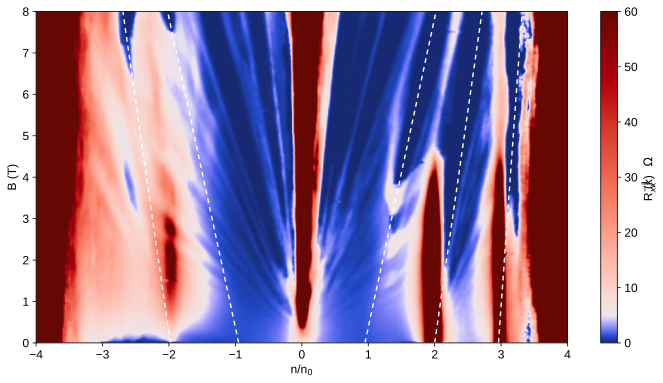

In [316]:
sl = 11.09489539
Vgatefull = 8.081768748385855
slfill = sl*Vgatefull/4

x = np.linspace(-5, 4.85, 1001)
y = np.linspace(0, 8, 801)
Rxx3837int = gaussian_filter(Rxx3837func(x, y), (1, 1)).T

plt.figure(figsize=(10, 5.5))
plt.pcolormesh(x, y, Rxx3837int/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(5000/1000, vmin=0, vmax=0.6e5/1000), rasterized=True)

Bl = 8
Bs = 0

nuhalfn = -1.98
b = -nuhalfn*slfill
i = -2
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuqn = -0.95
b = -nuqn*slfill
i = -3
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuqp = 0.95
b = -nuqp*slfill
i = 3
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuhalfp = 2
b = -nuhalfp*slfill
i = 2
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

# nuthreep = 3
# b = -nuthreep*slfill
# i = 1
# x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
# plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuthreep = 2.96
b = -nuthreep*slfill
i = 1
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)


c = plt.colorbar(label='R$_{xx}^{-1}$ (k$\Omega$)')
plt.xlabel('n/n$_0$')
plt.ylabel('B (T)')
plt.xlim(-4, 4)
plt.tight_layout()



6.720000000000002
7.4799999999999995
3.800000000000002
1.9200000000000017
3.280000000000001


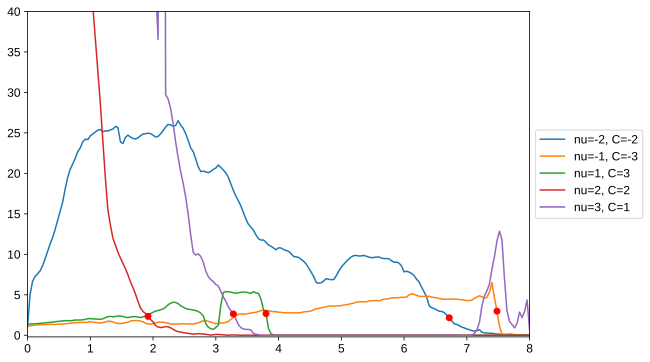

In [318]:
ymin, ymax = -0.2, 40
xmin, xmax = 0, 8

Bl = 8
Bs = 0

def linecut(nuint, slope):
    "put in the xintercept (in nu) and slope (integer corresponding to C)"
    b = -nuint*slfill
    i = slope
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 201)
    B = (x*slfill + b)/i
    cutRxx = np.zeros(len(B))
    for i in range(len(B)):
        cutRxx[i] = Rxx3837func(x[i], B[i])/1000
        
    return B, cutRxx # in kOhms

def cutoffB(B, cutRxx, dropoffval=2, beginning=-1):
    cutoff = 8
    indx = -1
    baseline = np.average(cutRxx[beginning-8:beginning])
    for i in range(len(B)):
        indx = beginning - i
        if (cutRxx[indx] - baseline) > dropoffval:
            cutoff = B[indx]
            break
    print(cutoff)
    return cutoff, indx

def plotcutoff(B, cut, label, dropoffval=2, beginning=-1):
    plt.plot(B, cut, label=label)
    cutoff, indx = cutoffB(B, cut, dropoffval=dropoffval, beginning=beginning)
    plt.plot(B[indx], cut[indx], 'or')

B1, cut1 = linecut(-1.98, -2)
B2, cut2 = linecut(-0.95, -3)
B3, cut3 = linecut(0.95, 3)
B4, cut4 = linecut(2, 2)
B5, cut5 = linecut(2.96, 1)

plt.figure(figsize=(9, 6))
plotcutoff(B1, cut1, label='nu=-2, C=-2')
plotcutoff(B2, cut2, label='nu=-1, C=-3')
plotcutoff(B3, cut3, label='nu=1, C=3')
plotcutoff(B4, cut4, label='nu=2, C=2')
plotcutoff(B5, cut5, label='nu=3, C=1', beginning=-30)
plt.ylim(ymin, ymax)
plt.xlim(xmin, xmax)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

## Stick fan schematic

## Rxx and Rxy line plots at 8T

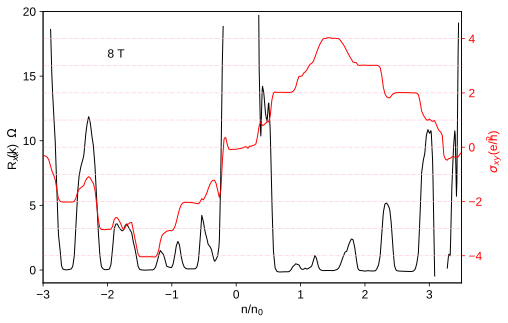

In [428]:
xmin, xmax = -3, 3.5
ymin, ymax = -1, 20

fig, ax = plt.subplots(1, 1, figsize=(7.5, 5))
lw = 1
# need to interpolate a little so everything shows up that should
x = np.linspace(xmin, xmax, 1000)
y = np.interp(x, filling3837[::-1], gaussian_filter(Rxx3837[-1, ::-1]/1000, 0.5))

ax.plot(np.ma.masked_outside(x, xmin, xmax), np.ma.masked_outside(y, ymin, ymax), 'k', lw=lw)
ax.yaxis.set_major_locator(plt.MultipleLocator(5))
ax.set_ylim(ymin, ymax)
ax.set_xlim(xmin, xmax)
ax.set_xlabel('n/n$_0$')
ax.set_ylabel('R$_{xx}$ (k$\Omega$)')

ymin2, ymax2 = -5, 5
ax2 = ax.twinx()
ax2.plot(np.ma.masked_outside(filling3837, xmin, xmax), np.ma.masked_outside(gaussian_filter(sigmaxy3844[-1, :]/esqh, 0.5), ymin2, ymax2), 'r', lw=lw)
ax2.set_ylim(ymin2, ymax2)
ax2.tick_params(labelcolor='red', colors='red')
ax2.set_ylabel('$\sigma_{xy}$ (e$^2$/h)', color='red')


## one idea is to plot lines just around the plateaus
# lwh = 0.5
# lwc = [0.5]*3
# xlength = 0.6

# xstart = 0.18
# plt.hlines(1, xstart, xstart+xlength, color=lwc, lw=lwh)

# xstart = 0.43
# plt.hlines(2, xstart, xstart+xlength, color=lwc, lw=lwh)

# xstart = 0.9
# plt.hlines(3, xstart, xstart+xlength, color=lwc, lw=lwh)

# xstart = 0.9
# plt.hlines(3, xstart, xstart+xlength, color=lwc, lw=lwh)

## The other is to plot lines throughout the diagram
lines = ax2.hlines(range(-4, 5), xmin, xmax, color='pink', lw=0.6, linestyles='dashdot')
# lines.set_dashes((5, 2, 1, 2))
ax2.text(-2, 3.3, '8 T')

# plt.savefig(figfile + 'M08_0p97_8T_linecuts.svg', dpi=300, bbox_inches='tight')

# M12 1.04$^\circ$ device, with Rxx and Rxy

## Rxx

In [46]:
dfanpos = qc.load_data('data/2019-11-09/#004_M12_22_20and22_12xy_LandauFan_5nA_8Tto-5T_15-30-05')
dfanneg = qc.load_data('data/2019-11-10/#001_M12_22_20and22_12xy_LandauFan_5nA_-8Tto0T_14-20-38')

Rxy12pos = dfanpos.lockin830_X[:81, :]/5e-9
Rxx12pos = npd.Rxxfromdata(dfanpos, 5e-9, 'lockin865')[:81, :]
sigmaxy12pos = Rxy12pos/(Rxx12pos**2 + Rxy12pos**2)
vbg12 = dfanpos.srframe_volt_p1_set[0, :]
bpos = dfanpos.triton_field_set_stable_set[:81]

Rxy12neg = dfanneg.lockin830_X[:, :]/5e-9
bneg = dfanneg.triton_field_set_stable_set[:]

In [47]:
Vgatefull = 6.38454649743731*1.13  # This was used to get the 1.04 degree angle. 0.98 degrees lines up with the nu=2 insulator better though. But in the T-nu diagram 1.04 deg lines up better.
V0 = -0.17928806297904745 + 0.2
fillingM12 = np.interp(vbg12, [V0 - Vgatefull*6/4, V0 + Vgatefull*6/4], [-6, 6])

In [48]:
esqh = 1.602e-19**2/6.626e-34

In [49]:
Rxx12posfunc = RectBivariateSpline(fillingM12[::-1], bpos[::-1], Rxx12pos[::-1, ::-1].T, kx=1, ky=1)

In [50]:
fillingM12[-1]

-3.8925360889997243

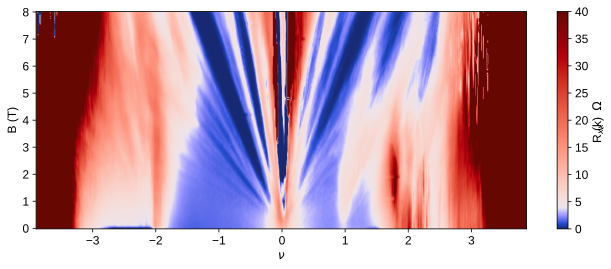

In [54]:
x = np.linspace(-3.892, 3.869, 1000)
y = np.linspace(0, 8, 201)

plt.figure(figsize=(11, 4))
plt.pcolormesh(x, y, Rxx12posfunc(x, y).T/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(4, 0, 40), rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.ylabel('B (T)')
plt.xlabel('$\\nu$')
# plt.tight_layout()
# plt.savefig(figfile + 'M12_1p04_RxxFanto8T.svg', dpi=300, bbox_inches='tight')

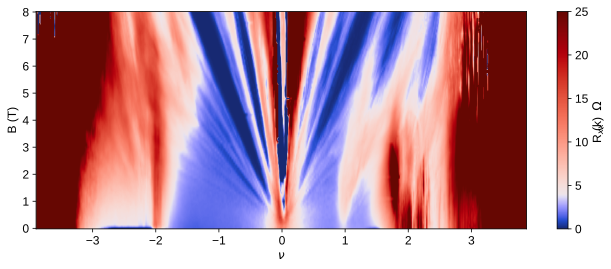

In [57]:
x = np.linspace(-3.892, 3.869, 1000)
y = np.linspace(0, 8, 201)

plt.figure(figsize=(11, 4))
plt.pcolormesh(x, y, Rxx12posfunc(x, y).T/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(4, 0, 25), rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.ylabel('B (T)')
plt.xlabel('$\\nu$')
# plt.tight_layout()
# plt.savefig(figfile + 'M12_1p04_RxxFanto8T_25kohm.svg', dpi=300, bbox_inches='tight')

## Rxy

In [654]:
invRxym12func = RectBivariateSpline(fillingM12[::-1], bpos[::-1], (1/(Rxy12pos[::-1, ::-1]+0.0001)/esqh).T, kx=1, ky=1)

(-4, 4)

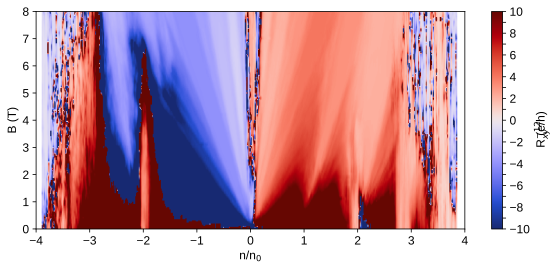

In [655]:
x = np.linspace(fillingM12[-1], fillingM12[1], 600)
y = np.linspace(0, 8, 200)

plt.figure(figsize=(8, 3.7))
# plt.pcolormesh(fillingM12, bpos, 1/(Rxy12pos+0.0001)/esqh, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(0, -10, 10), rasterized=True)
plt.pcolormesh(x, y, invRxym12func(x, y).T, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(0, -10, 10), rasterized=True)
c = plt.colorbar(label='R$_{xy}^{-1}$ (e$^2$/h)', ticks=plt.MultipleLocator(1))
for label in c.ax.get_yticklabels()[1::2]:
    label.set_visible(False)
plt.tight_layout()
plt.xlabel('n/n$_0$')
plt.ylabel('B (T)')
plt.xlim(-4, 4)
# plt.savefig(figfile + 'M12_1p04_invRxyFanto8T.svg', dpi=300, bbox_inches='tight')

## Determination of the Chern band minimum fields

(-4, 4)

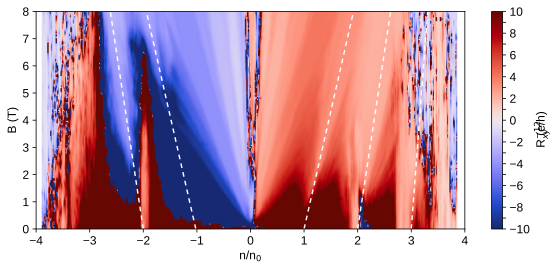

In [656]:
Vgatefull = 6.38454649743731*1.13
slfill = 14.42471356*Vgatefull/4

x = np.linspace(fillingM12[-1], fillingM12[1], 600)
y = np.linspace(0, 8, 200)

plt.figure(figsize=(8, 3.7))
# plt.pcolormesh(fillingM12, bpos, 1/(Rxy12pos+0.0001)/esqh, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(0, -10, 10), rasterized=True)
plt.pcolormesh(x, y, invRxym12func(x, y).T, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(0, -10, 10), rasterized=True)

Bl = 8
Bs = 0

nuhalfn = -2
b = -nuhalfn*slfill
i = -2
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuqn = -1.02
b = -nuqn*slfill
i = -3
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuqp = 1
b = -nuqp*slfill
i = 3
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuhalfp = 2
b = -nuhalfp*slfill
i = 2
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuthreep = 3
b = -nuthreep*slfill
i = 1
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

c = plt.colorbar(label='R$_{xy}^{-1}$ (e$^2$/h)', ticks=plt.MultipleLocator(1))
for label in c.ax.get_yticklabels()[1::2]:
    label.set_visible(False)
plt.tight_layout()
plt.xlabel('n/n$_0$')
plt.ylabel('B (T)')
plt.xlim(-4, 4)

In [668]:
def cutoffB(B, R, val, beginning=-1, dropoff=0.15):
    """ the point at which the value drops 15% (or dropoff) from the quantized value val. You can provide the beginning index.
    Assumes that B is ascending.
    Use < for lessthan and greater for > in the comparison"""
    cutoff = 8
    indx = -1
    for i in range(len(B)):
        indx = beginning - i
        if np.abs(R[indx] - val)/np.abs(val) > dropoff:
            cutoff = B[indx]
            break
    return cutoff, indx

def cutoffB_line(B, R, sl, intercept, beginning=-1, dropoff=0.15):
    """ the point at which the value drops 15% (or dropoff) from the quantized value val. You can provide the beginning index.
    Assumes that B is ascending.
    Use < for lessthan and greater for > in the comparison"""
    cutoff = 8
    indx = -1
    for i in range(len(B)):
        indx = beginning - i
        linfit = sl*B[indx] + intercept
        if np.abs(R[indx] - linfit)/np.abs(linfit) > dropoff:
            cutoff = B[indx]
            break
    return cutoff, indx

3.1999999999999993
6.319999999999999
2.439999999999999
3.1199999999999974


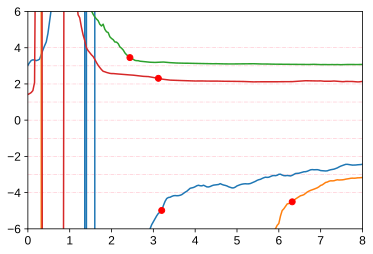

In [672]:
ymin, ymax = -6, 6
xmin, xmax = 0, 8

Bl = 8
Bs = 0

def linecut(nuint, slope):
    "put in the xintercept (in nu) and slope (integer corresponding to C)"
    b = -nuint*slfill
    i = slope
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 201)
    B = (x*slfill + b)/i
    cutinvRxy = np.zeros(len(B))
    for i in range(len(B)):
        cutinvRxy[i] = invRxym12func(x[i], B[i])
        
    return B, cutinvRxy

def plotcut(B, cut, val, beginning=-1):
    cutB, indx = cutoffB(B, cut, val, beginning=beginning)
    print(cutB)
    plt.plot(B, cut)
    plt.plot(B[indx], cut[indx], 'or')

def plotcut_line(B, cut, sl, intercept, beginning=-1):
    cutB, indx = cutoffB_line(B, cut, sl, intercept, beginning=beginning)
    print(cutB)
    plt.plot(B, cut)
    plt.plot(B[indx], cut[indx], 'or')

B1, cut1 = linecut(-2, -2)
B2, cut2 = linecut(-1.02, -3)
B3, cut3 = linecut(1, 3)
B4, cut4 = linecut(2, 2)
# B5, cut5 = linecut(3, 1)

## set up a case unique to B1, cut1 (-2, -2), fit a line to the highest fields and then take the deviation from that
subsl, subb = np.polyfit(B1[-30:], cut1[-30:], 1)
# also try B2, cut2
subsl2, subb2 = np.polyfit(B2[-30:], cut2[-30:], 1)

plt.figure()
# plotcut(B1, cut1, -3.6, beginning=-50)
plotcut_line(B1, cut1, subsl, subb)
# plotcut(B2, cut2, -3.7)
plotcut_line(B2, cut2, subsl2, subb2)
plotcut(B3, cut3, 3)
plotcut(B4, cut4, 2)
# plotcut(B5, cut5, 1, beginning=-140)
plt.ylim(ymin, ymax)
plt.xlim(xmin, xmax)
plt.hlines(range(-4, 5), xmin, xmax, color='pink', linestyle='dashdot', lw=0.6)

### Try Rxx for the Chern determination

(-4, 4)

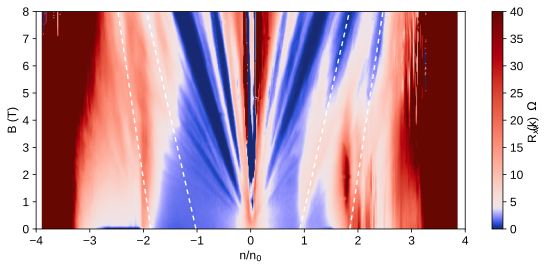

In [303]:
Vgatefull = 6.38454649743731*1.13
slfill = 14.42471356*Vgatefull/4

x = np.linspace(fillingM12[-1], fillingM12[1], 600)
y = np.linspace(0, 8, 200)

plt.figure(figsize=(8, 3.7))
# plt.pcolormesh(fillingM12, bpos, 1/(Rxy12pos+0.0001)/esqh, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(0, -10, 10), rasterized=True)
plt.pcolormesh(x, y, Rxx12posfunc(x, y).T/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(4, 0, 40), rasterized=True)

Bl = 8
Bs = 0

nuhalfn = -1.86
b = -nuhalfn*slfill
i = -2
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuqn = -1.02
b = -nuqn*slfill
i = -3
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuqp = 0.92
b = -nuqp*slfill
i = 3
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuhalfp = 1.85
b = -nuhalfp*slfill
i = 2
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)


c = plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.tight_layout()
plt.xlabel('n/n$_0$')
plt.ylabel('B (T)')
plt.xlim(-4, 4)

5.959999999999997
6.64
5.040000000000002
4.640000000000001


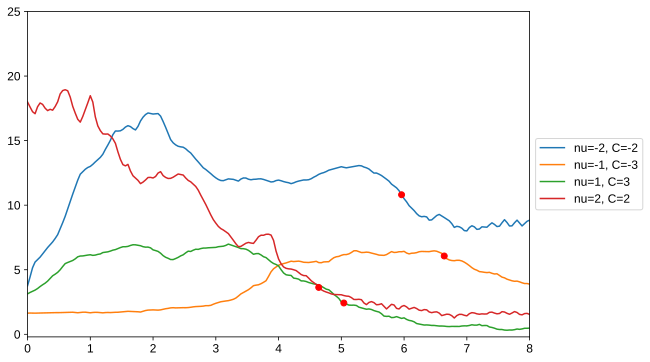

In [304]:
ymin, ymax = -0.2, 25
xmin, xmax = 0, 8

Bl = 8
Bs = 0

def linecut(nuint, slope):
    "put in the xintercept (in nu) and slope (integer corresponding to C)"
    b = -nuint*slfill
    i = slope
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 201)
    B = (x*slfill + b)/i
    cutRxx = np.zeros(len(B))
    for i in range(len(B)):
        cutRxx[i] = Rxx12posfunc(x[i], B[i])/1000
        
    return B, cutRxx # in kOhms

def cutoffB(B, cutRxx, dropoffval=2, beginning=-1):
    cutoff = 8
    indx = -1
    baseline = np.average(cutRxx[beginning-8:beginning])
    for i in range(len(B)):
        indx = beginning - i
        if (cutRxx[indx] - baseline) > dropoffval:
            cutoff = B[indx]
            break
    print(cutoff)
    return cutoff, indx

def plotcutoff(B, cut, label, dropoffval=2, beginning=-1):
    plt.plot(B, cut, label=label)
    cutoff, indx = cutoffB(B, cut, dropoffval=dropoffval, beginning=beginning)
    plt.plot(B[indx], cut[indx], 'or')

B1, cut1 = linecut(-1.86, -2)
B2, cut2 = linecut(-1.02, -3)
B3, cut3 = linecut(0.92, 3)
B4, cut4 = linecut(1.85, 2)

plt.figure(figsize=(9, 6))
plotcutoff(B1, cut1, label='nu=-2, C=-2') # should this one be used? It seems that it looks better in the +B Rxx fan, so maybe there's just an offset
plotcutoff(B2, cut2, label='nu=-1, C=-3')  # should this one be used?
plotcutoff(B3, cut3, label='nu=1, C=3')
plotcutoff(B4, cut4, label='nu=2, C=2')
plt.ylim(ymin, ymax)
plt.xlim(xmin, xmax)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

## Try playing around with discrete colormaps

In [219]:
def sectioned_cmap(nlim, plim, boundthickness=0.2, sep_color=[0.2, 0.2, 0.2], basecmap=cc.cm.diverging_bwr_20_95_c54):
    N = int(plim) - int(nlim) + 1
    clist = basecmap([i/(N-1) for i in range(N)])
    fullclist = np.zeros((2*N-1, 4))
    count = 0
    for i in range(len(fullclist)):
        if i%2 == 0:
            fullclist[i, :] = clist[count, :]
            count += 1
        else:
            fullclist[i, :] = sep_color + [1]
    
    intthickness = 1 - boundthickness
    bounds = [int(nlim) - intthickness/2]
    for i in range(len(fullclist)):
        if i%2 == 0:
            bounds.append(bounds[-1] + intthickness)
        else:
            bounds.append(bounds[-1] + boundthickness)
            
    cmap = mpl.colors.ListedColormap(fullclist)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    return cmap, norm

In [216]:
cmap = mpl.colors.ListedColormap(fullclist)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

In [226]:
cm, bnorm = sectioned_cmap(-10, 10)

(-4, 4)

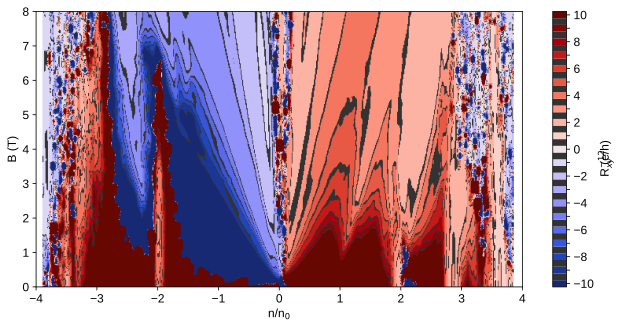

In [259]:
x = np.linspace(fillingM12[-1], fillingM12[1], 600)
y = np.linspace(0, 8, 400)

plt.figure(figsize=(9, 4.5))
# plt.pcolormesh(fillingM12, bpos, 1/(Rxy12pos+0.0001)/esqh, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(0, -10, 10), rasterized=True)
plt.pcolormesh(x, y, gaussian_filter(invRxym12func(x, y).T, (1, 1)), cmap=cm, norm=bnorm, rasterized=True)
c = plt.colorbar(label='R$_{xy}^{-1}$ (e$^2$/h)', ticks=plt.MultipleLocator(1))
for label in c.ax.get_yticklabels()[1::2]:
    label.set_visible(False)
plt.tight_layout()
plt.xlabel('n/n$_0$')
plt.ylabel('B (T)')
plt.xlim(-4, 4)
# plt.savefig(figfile + 'M12_invRxy_with_separators.svg', dpi=300, bbox_inches='tight')

## sigmaxy

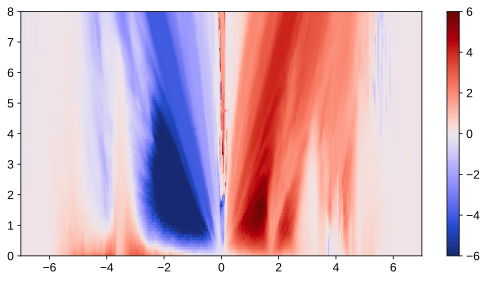

In [126]:
plt.figure(figsize=(9, 4.5))
plt.pcolormesh(vbg12, bpos, sigmaxy12pos/esqh, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(0, -6, 6), rasterized=True)
plt.colorbar()

# M10, 1.14$^\circ$

## Rxx and Rxy

In [20]:
dm10_1 = qc.load_data('data/2019-11-06/#006_M10_26_25and26_29xy_LandauFan_5nA_7Tto0T_21-41-34')
vbgm10_1 = dm10_1.srframe_volt_p1_set[0, :]
Bm10_1 = dm10_1.triton_field_set_stable_set[:]
Rxxm2625_1 = npd.Rxxfromdata(dm10_1, 5e-9, 'lockin865')
Rxym2629_1 = dm10_1.lockin830_X[:, :]/5e-9

In [21]:
sl = -12.3
C = -sl*1.602e-19**2/6.626e-34
dBN = 3*8.85e-12/C
V0 = 0.12
print('effective capacitance: {:.4e}'.format(C))
print('effective hBN thickness: {:.1f} nm'.format(dBN*10**9))

effective capacitance: 4.7641e-04
effective hBN thickness: 55.7 nm


In [22]:
Vgatefull = 10.1
print('Full filling voltage difference: {}'.format(Vgatefull))
nfull = (Vgatefull)*C/1.602e-19/10**4
print(nfull/10**12) #10**12 cm^-2
a = 0.246e-9

theta = np.sqrt(np.sqrt(3)*nfull*10**4*a**2/8)*180/np.pi
print('theta: ', theta)

Full filling voltage difference: 10.1
3.0035686688801695
theta:  1.1366109676100764


In [23]:
Vgatefull = 10.1
V0 = 0.12
filling2625_1 = np.interp(vbgm10_1, [V0 - Vgatefull*5/4, V0 + Vgatefull*5/4], [-5, 5])

## 0 to 7T, not as good, except possible the Rxy hole side

(-0.7, 0.7, 0, 20)

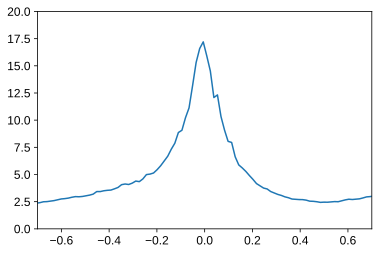

In [26]:
plt.figure()
plt.plot(filling2625_1*nfull/10**12/4, Rxxm2625_1[-1, :]/1000)
plt.axis((-0.7, 0.7, 0, 20))

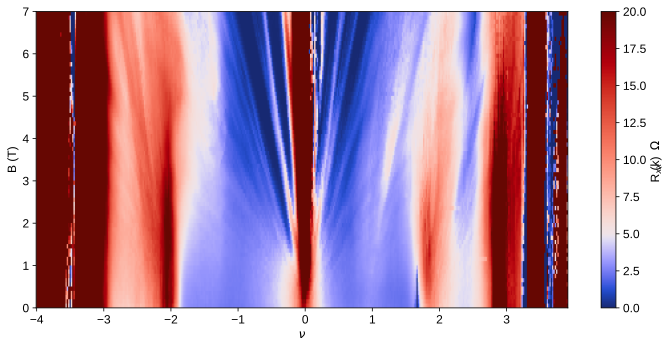

In [114]:
plt.figure(figsize=(10, 5))
plt.pcolormesh(filling2625_1, Bm10_1, Rxxm2625_1/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(5, 0, 20), rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.ylabel('B (T)')
plt.xlabel('$\\nu$')
plt.tight_layout()
# plt.savefig(figfile + 'M10_1p14_2625Rxxfandiagram.svg', dpi=300, bbox_inches='tight')

# V0 = 0.13
# sl = 12.3
# b = -sl*V0
# Vgatefull = 8.081768748385855
# slfill = sl#-sl*Vgatefull/4

# Bl = 6.5
# Bs = 0
# LW = 0.7
# dashes = (6, 5)
# for i in [-14, -10, -8, -6, -4, -2, 2, 3, 4, 6, 8, 10]:
#     x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
#     plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=LW, dashes=dashes)


Text(301.41666666666663, 0.5, 'B (T)')

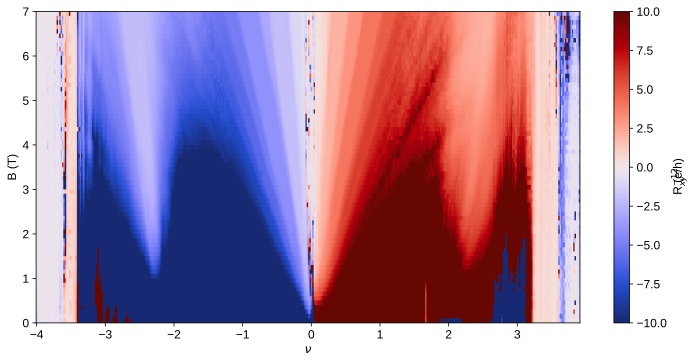

In [115]:
plt.figure(figsize=(10, 5))
plt.pcolormesh(filling2625_1, Bm10_1, -1/(Rxym2629_1+0.0001)/esqh, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(0, -10, 10), rasterized=True)
plt.colorbar(label='R$_{xy}^{-1}$ (e$^2$/h)')
plt.tight_layout()
plt.xlabel('$\\nu$')
plt.ylabel('B (T)')
# plt.savefig(figfile + 'M10_1p14_2629Rxyfandiagram.svg', dpi=300, bbox_inches='tight')

## Maybe 0 to -7 is better. Rxx shows the emerging Chern insulator states on the hole side

In [116]:
dm10_2 = qc.load_data('data/2019-11-07/#002_M10_26_25and26_29xy_LandauFan_5nA_-7Tto0T_11-51-53')
vbgm10_2 = dm10_2.srframe_volt_p1_set[0, :]
Bm10_2 = dm10_2.triton_field_set_stable_set[:]
Rxxm2625_2 = npd.Rxxfromdata(dm10_2, 5e-9, 'lockin865')
Rxym2629_2 = dm10_2.lockin830_X[:, :]/5e-9

In [117]:
Vgatefull = 10.1
V0 = 0.12
filling2625_2 = np.interp(vbgm10_2, [V0-0.02 - Vgatefull*5/4, V0-0.02 + Vgatefull*5/4], [-5, 5])

In [123]:
Rxxm2625_2int = RectBivariateSpline(filling2625_2[::-1], -Bm10_2[::-1], Rxxm2625_2[::-1, ::-1].T, kx=1, ky=1)

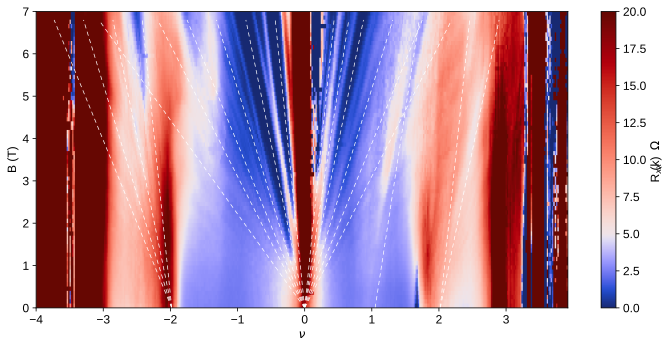

In [118]:

plt.figure(figsize=(10, 5))
plt.pcolormesh(filling2625_2, -Bm10_2, Rxxm2625_2/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(5, 0, 20), rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.ylabel('B (T)')
plt.xlabel('$\\nu$')
plt.tight_layout()

V0 = 0
sl = 12.3
b = -sl*V0
Vgatefull = 10.1
slfill = sl*Vgatefull/4

Bl = 6.8
Bs = 0
LW = 0.7
dashes = (6, 5)
for i in [-14, -10, -8, -6, -4, -2, 2, 3, 4, 6, 8, 10]:
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
    plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=LW, dashes=dashes)
    
Vhalf = 5.1
b = -sl*Vhalf
for i in [2, 4]:
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
    plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=LW, dashes=dashes)
    
Vhalfn = -5
b = -sl*Vhalfn
for i in [-2, -4, -6, -8]:
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
    plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=LW, dashes=dashes)

Vquart = 2.65
b = -sl*Vquart
i = 3
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=LW, dashes=dashes)


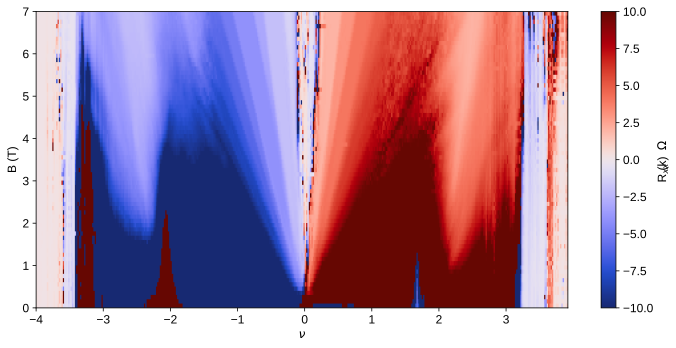

In [561]:
plt.figure(figsize=(10, 5))
plt.pcolormesh(filling2625_2, -Bm10_2, 1/(Rxym2629_2 + 0.0001)/esqh, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(0, -10, 10), rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.ylabel('B (T)')
plt.xlabel('$\\nu$')
plt.tight_layout()

## Better Rxy data to 8T

In [103]:
dm10rxy0 = qc.load_data('data/2019-11-15/#006_M10_26_29_865and25_2_830_8Tto0T_2nA_13-56-49')
dm10rxy1 = qc.load_data('data/2019-11-17/#001_M10_26_29_865and25_2_830_5.5Tto0T_2nA_14-28-41')
Brxym10 = np.concatenate((dm10rxy0.triton_field_set_stable_set[:25], dm10rxy1.triton_field_set_stable_set[:]))
vbgm10_rxy = dm10rxy0.srframe_volt_p1_set[0, :]
Rxy2629_2 = np.vstack((dm10rxy0.lockin865_X[:25, :], dm10rxy1.lockin865_X[:, :]))/2e-9
Rxy252_1 = np.vstack((dm10rxy0.lockin830_X[:25, :], dm10rxy1.lockin830_X[:, :]))/2e-9

In [104]:
V0_1 = V0 + 0.45
filling2625_2 = np.interp(vbgm10_rxy, [V0_1 - Vgatefull*8/4, V0_1 + Vgatefull*8/4], [-8, 8])

In [105]:
invRxy2629func = RectBivariateSpline(filling2625_2, Brxym10[::-1], (-1/Rxy2629_2[::-1, :]/esqh).T, kx=1, ky=1)

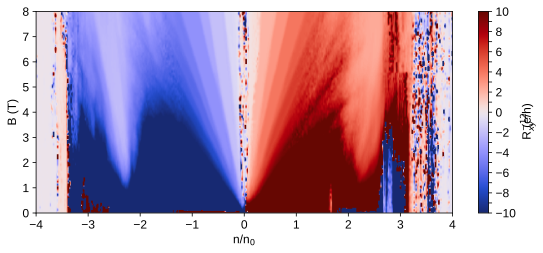

In [106]:
x = np.linspace(-4, 4, 500)
y = np.linspace(0, 8, 200)
plt.figure(figsize=(8, 3.7))
plt.pcolormesh(x, y, invRxy2629func(x, y).T, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(0, -10, 10), rasterized=True)
c = plt.colorbar(label='R$_{xy}^{-1}$ (e$^2$/h)', ticks=plt.MultipleLocator(1))
for label in c.ax.get_yticklabels()[1::2]:
    label.set_visible(False)
plt.xlabel('n/n$_0$')
plt.xlabel('n/n$_0$')
plt.ylabel('B (T)')
plt.xlim(-4, 4)
plt.tight_layout()
# plt.savefig(figfile + 'M10_2629_invRxyto8T.svg', dpi=300, bbox_inches='tight')

## Determination of the Chern band minimum fields

(-4, 4)

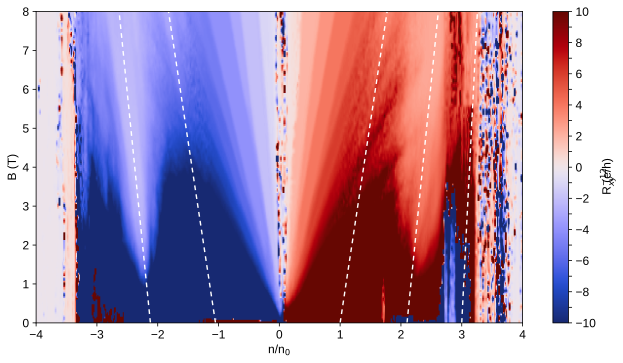

In [586]:
Vgatefull = 10.1
slfill = 12.3*Vgatefull/4

x = np.linspace(-4, 4, 500)
y = np.linspace(0, 8, 200)
plt.figure(figsize=(9, 5))
plt.pcolormesh(x, y, invRxy2629func(x, y).T, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(0, -10, 10), rasterized=True)

Bl = 8
Bs = 0

nuhalfn = -2.12
b = -nuhalfn*slfill
i = -2
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuqn = -1.05
b = -nuqn*slfill
i = -3
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuqp = 1
b = -nuqp*slfill
i = 3
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuhalfp = 2.1
b = -nuhalfp*slfill
i = 2
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

nuthreep = 3
b = -nuthreep*slfill
i = 1
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=boldLW, dashes=bolddashes)

c = plt.colorbar(label='R$_{xy}^{-1}$ (e$^2$/h)', ticks=plt.MultipleLocator(1))
for label in c.ax.get_yticklabels()[1::2]:
    label.set_visible(False)
plt.tight_layout()
plt.xlabel('n/n$_0$')
plt.ylabel('B (T)')
plt.xlim(-4, 4)

In [587]:
def cutoffB(B, R, val, beginning=-1, dropoff=0.15):
    """ the point at which the value drops 15% (or dropoff) from the quantized value val. You can provide the beginning index.
    Assumes that B is ascending.
    Use < for lessthan and greater for > in the comparison"""
    cutoff = 8
    indx = -1
    for i in range(len(B)):
        indx = beginning - i
        if np.abs(R[indx] - val)/np.abs(val) > dropoff:
            cutoff = B[indx]
            break
    return cutoff, indx

4.422110552763822
7.758793969849244
8.000000000000002
5.668341708542716


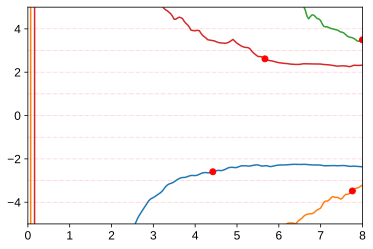

In [595]:
ymin, ymax = -5, 5
xmin, xmax = 0, 8

Bl = 8
Bs = 0

def linecut(nuint, slope):
    "put in the xintercept (in nu) and slope (integer corresponding to C)"
    b = -nuint*slfill
    i = slope
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 200)
    B = (x*slfill + b)/i
    cutinvRxy = np.zeros(len(B))
    for i in range(len(B)):
        cutinvRxy[i] = invRxy2629func(x[i], B[i])
        
    return B, cutinvRxy

def plotcut(B, cut, val, beginning=-1):
    cutB, indx = cutoffB(B, cut, val, beginning=beginning)
    print(cutB)
    plt.plot(B, cut)
    plt.plot(B[indx], cut[indx], 'or')

B1, cut1 = linecut(-2, -2)
B2, cut2 = linecut(-1.02, -3)
B3, cut3 = linecut(1, 3)
B4, cut4 = linecut(2, 2)
# B5, cut5 = linecut(3, 1)

plt.figure()
plotcut(B1, cut1, -2.25)
plotcut(B2, cut2, -3)
plotcut(B3, cut3, 3)
plotcut(B4, cut4, 2.25)
# plotcut(B5, cut5, 1, beginning=-140)
plt.ylim(ymin, ymax)
plt.xlim(xmin, xmax)
plt.hlines(range(-4, 5), xmin, xmax, color='pink', linestyle='dashdot', lw=0.6)

### Trying with Rxx

In [124]:
filling2625_2[0]

3.9207920792079207

(-4, 4)

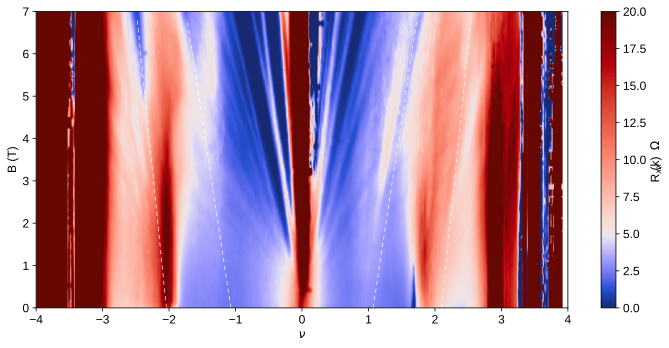

In [139]:
x = np.linspace(-4, 3.92, 801)
y = np.linspace(0, 7, 181)

plt.figure(figsize=(10, 5))
plt.pcolormesh(x, y, Rxxm2625_2int(x, y).T/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(5, 0, 20), rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.ylabel('B (T)')
plt.xlabel('$\\nu$')
plt.tight_layout()

V0 = 0
sl = 12.3
b = -sl*V0
Vgatefull = 10.1
slfill = sl*Vgatefull/4

Bl = 6.8
Bs = 0
LW = 0.7
# dashes = (6, 5)
# for i in [-14, -10, -8, -6, -4, -2, 2, 3, 4, 6, 8, 10]:
#     x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
#     plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=LW, dashes=dashes)
    
nuhalf = 2.1
b = -slfill*nuhalf
i = 2
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=LW, dashes=dashes)
    
nuhalfn= -2.04
b = -slfill*nuhalfn
i = -2
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=LW, dashes=dashes)

nuquart = 1.07
b = -slfill*nuquart
i = 3
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=LW, dashes=dashes)

nuquartn = -1.07
b = -slfill*nuquartn
i = -3
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=LW, dashes=dashes)

plt.xlim(-4, 4)

5.522222222222222
6.416666666666665


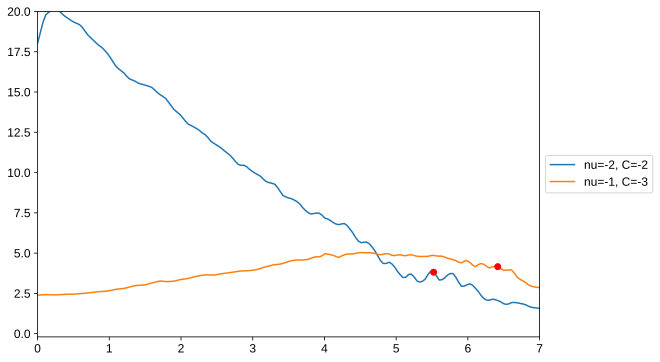

In [301]:
ymin, ymax = -0.2, 20
xmin, xmax = 0, 7

Bl = 7
Bs = 0

def linecut(nuint, slope):
    "put in the xintercept (in nu) and slope (integer corresponding to C)"
    b = -nuint*slfill
    i = slope
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 181)
    B = (x*slfill + b)/i
    cutRxx = np.zeros(len(B))
    for i in range(len(B)):
        cutRxx[i] = Rxxm2625_2int(x[i], B[i])/1000
        
    return B, cutRxx # in kOhms

def cutoffB(B, cutRxx, dropoffval=2, beginning=-1):
    cutoff = 7
    indx = -1
    baseline = np.average(cutRxx[beginning-8:beginning])
    for i in range(len(B)):
        indx = beginning - i
        if (cutRxx[indx] - baseline) > dropoffval:
            cutoff = B[indx]
            break
    print(cutoff)
    return cutoff, indx

def plotcutoff(B, cut, label, dropoffval=2, beginning=-1):
    plt.plot(B, cut, label=label)
    cutoff, indx = cutoffB(B, cut, dropoffval=dropoffval, beginning=beginning)
    plt.plot(B[indx], cut[indx], 'or')

B1, cut1 = linecut(-2.04, -2)
B2, cut2 = linecut(-1.07, -3)
B3, cut3 = linecut(1.07, 3)
B4, cut4 = linecut(2.1, 2)

plt.figure(figsize=(9, 6))
plotcutoff(B1, cut1, label='nu=-2, C=-2')
plotcutoff(B2, cut2, label='nu=-1, C=-3', dropoffval=1)
# plotcutoff(B3, cut3, label='nu=1, C=3')  # Doesn't seem to apply to this. No clear Rxx drop
# plotcutoff(B4, cut4, label='nu=2, C=2')  # Doesn't seem to apply to this. No clear Rxx drop
plt.ylim(ymin, ymax)
plt.xlim(xmin, xmax)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

## Discrete colormap

(-4, 4)

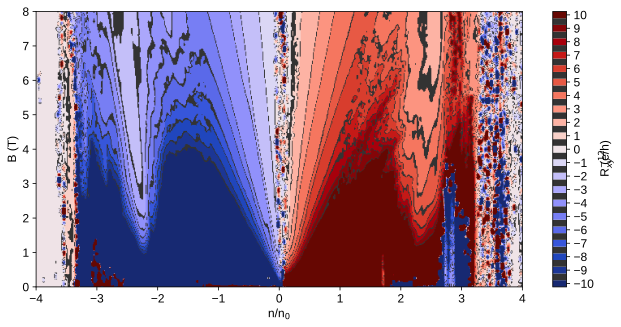

In [263]:
cm, bnorm = sectioned_cmap(-10, 10)  # go back to M12 and run the sectioned_cmap function

invRxy2629_2func = RectBivariateSpline(filling2625_2, Brxym10[::-1], (-1/Rxy2629_2[::-1, :]/esqh).T)
x = np.linspace(-4, 4, 600)
y = np.linspace(0, 8, 400)

plt.figure(figsize=(9, 4.5))
plt.pcolormesh(x, y, gaussian_filter(invRxy2629_2func(x, y).T, (1, 1)), cmap=cm, norm=bnorm, rasterized=True)
plt.colorbar(label='R$_{xy}^{-1}$ (e$^2$/h)', ticks=plt.MultipleLocator(1))
plt.tight_layout()
plt.xlabel('n/n$_0$')
plt.ylabel('B (T)')
plt.xlim(-4, 4)
# plt.savefig(figfile + 'M10_2629_invRxyto8T_separatedcolors.svg', dpi=300, bbox_inches='tight')

## Some data with 20 nA excitation at high fields

In [97]:

dm10_HF = qc.load_data('data/2019-11-20/#003_M10_26_25_865and26_29_830_-8Tto-6T_20nA_18-23-19')
vhf1 = dm10_HF.srframe_volt_p1_set[0, :]
HFRxx = npd.Rxxfromdata(dm10_HF, 20e-9, 'lockin865')[:-5, :]
HFRxy = dm10_HF.lockin830_X[:-5, :]/20e-9
BHF = np.linspace(-8, -6.5, 16)

In [98]:
HFRxx.shape

(16, 1501)

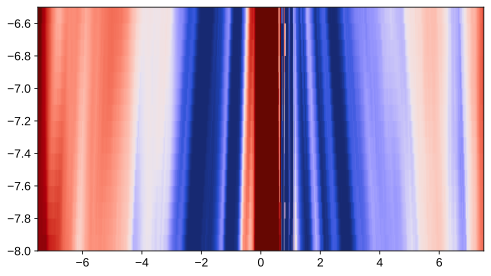

In [100]:
plt.figure(figsize=(8, 4.5))
plt.pcolormesh(vhf1, BHF, HFRxx/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(5, 0, 20), rasterized=True)

In [101]:
sigmaxyHF = HFRxy/(HFRxx**2 + HFRxy**2)

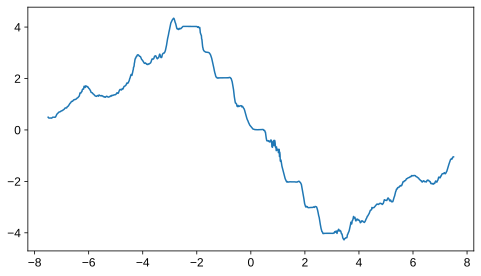

In [108]:
plt.figure(figsize=(8, 4.5))
plt.plot(vhf1, sigmaxyHF[0, :]/esqh)
# plt.axis([-8, 0, 0, 4.5])

# W3

In [10]:
dfanw3 = qc.load_data('data/2020-02-11/#002_W5_865_48-24_830_21-24_baseT_1nA_B-Vgsweep_09-37-41')

In [11]:
Rxxfanw3 = dfanw3.lockin865_X[:, 25:]/1e-9
gfanw3 = dfanw3.srframe_volt_p1_set[0, 25:]
bfanw3 = dfanw3.triton_field_set_stable_set[:]

In [12]:
sl = -15.1
C = -sl*1.602e-19**2/6.626e-34
dBN = 3*8.85e-12/C
V0 = 0.42
Vhp = 4.24
Vgatefull = (Vhp - V0)*2
print('effective capacitance: {:.4e}'.format(C))
print('effective hBN thickness: {:.1f} nm'.format(dBN*10**9))

effective capacitance: 5.8486e-04
effective hBN thickness: 45.4 nm


In [13]:
print('Full filling voltage difference: {}'.format(Vgatefull))
nfull = (Vgatefull)*C/1.602e-19/10**4
print(nfull/10**12) #10**12 cm^-2
a = 0.246e-9

theta = np.sqrt(np.sqrt(3)*nfull*10**4*a**2/8)*180/np.pi
print('theta: ', theta)

Full filling voltage difference: 7.640000000000001
2.78921110775732
theta:  1.0953016773036148


In [14]:
fillingw3 = np.interp(gfanw3, [V0 - Vgatefull*6/4, V0 + Vgatefull*6/4], [-6, 6])

In [15]:
indices = [i not in (21, 22) for i in range(len(bfanw3))] #get rid of 1.05, 1.1

In [16]:
Rfanw3func = RectBivariateSpline(fillingw3, bfanw3[indices], Rxxfanw3[indices, :].T, kx=1, ky=1)

(-4.5, 4.7)

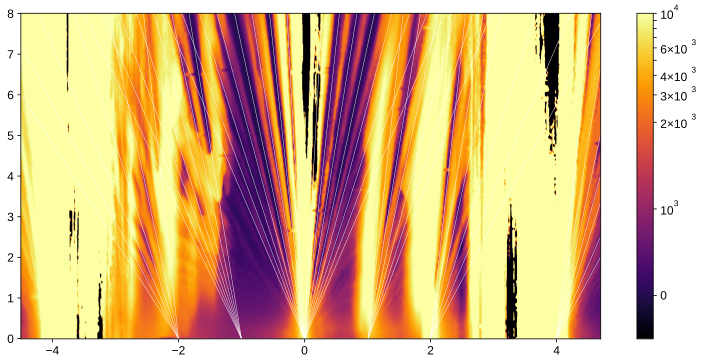

In [17]:
x = np.linspace(-4.5, 4.7, 1500)
y = np.linspace(0, 8, 600)
Rxxfanw3int = gaussian_filter(Rfanw3func(x, y).T, (1.2, 1.2))

fig, ax = plt.subplots(1, 1, figsize=(13, 6))
norm = SymLogNorm(2000, vmin=-500, vmax=1e4)
p1 = ax.pcolormesh(x, y, Rxxfanw3int, cmap='inferno', norm=norm, rasterized=True)
plt.colorbar(p1, ax=ax)

Bl = 8
Bs = 0
sl = 15.1
b = 0
LW = 0.4
slfill = sl*Vgatefull/4

# CNP
for i in [-8, -7, -5, -6, -4, -3, -2, -1, 1, 2, 3, 4, 5, 6, 7, 8]:
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 10)
    ax.plot(x, (x*slfill + b)/i, color='white', lw=LW)
    
#+half filling
nuhp = 2
b = -nuhp*slfill
for i in [2, 3, 4, 6, 8, 10]:
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 10)
    ax.plot(x, (x*slfill + b)/i, color='white', lw=LW)
    
#+quarter filling
nuqp = 1.01
b = -nuqp*slfill
for i in [2, 3, 4, 5, 6, 7]:
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 10)
    ax.plot(x, (x*slfill + b)/i, color='white', lw=LW)
    
#-half filling
nuhpn = -2
b = -nuhpn*slfill
for i in [-2, -4, -6, -8, -10, -12]:
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 10)
    ax.plot(x, (x*slfill + b)/i, color='white', lw=LW)
    
    
#-quarter filling
nuqn = -1
b = -nuqn*slfill
for i in [-3, -4, -5, -6, -7, -8, -9]:
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 10)
    ax.plot(x, (x*slfill + b)/i, color='white', lw=LW)
    
# nuqp2 = 0.99
# b = -nuqp2*slfill
# for i in [2, 3, 10, 13, 16]:
#     x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 10)
#     ax.plot(x, (x*slfill + b)/i, color='white', lw=LW)
    
#+full filling
nufp = 4
b = -nufp*slfill
for i in [2, 3, 4, 5, 6, 8, 10]:
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 10)
    ax.plot(x, (x*slfill + b)/i, color='white', lw=LW)

ax.set_xlim(-4.5, 4.7)
# p2 = ax[1].pcolormesh(gfanint, yfanint, Rxxfan1int, cmap='inferno', norm=norm, rasterized=True)

# ax[0].axis((2, 10, 0.0, 8.0))
# ax[1].axis((2, 6, 0.0, 8.0))

Text(0, 0.5, 'B (T)')

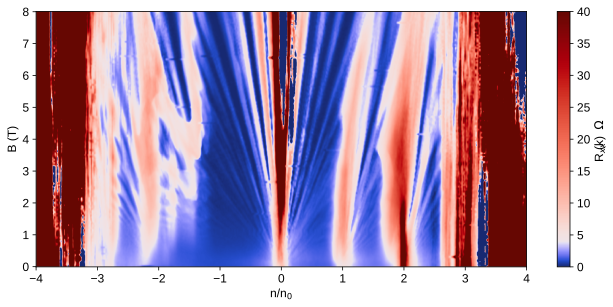

In [18]:
x = np.linspace(-4.5, 4.7, 1500)
y = np.linspace(0, 8, 600)
Rxxfanw3int = gaussian_filter(Rfanw3func(x, y).T, (1.2, 1.2))

fig, ax = plt.subplots(1, 1, figsize=(11, 4.7))
p1 = ax.pcolormesh(x, y, Rxxfanw3int/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(4, 0, 40), rasterized=True)
plt.colorbar(p1, ax=ax, label='R$_{xx}$ (k$\Omega$)')
ax.set_xlim(-4, 4)
ax.set_xlabel('n/n$_0$')
ax.set_ylabel('B (T)')
# plt.savefig(figfile + 'W3_1p10_Fandiagramto8T.svg', dpi=300, bbox_inches='tight')

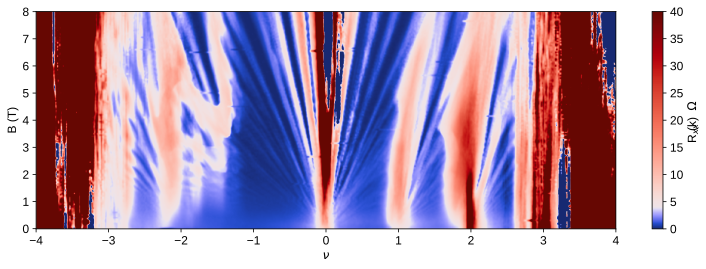

In [24]:
x = np.linspace(-4.5, 4.7, 1500)
y = np.linspace(0, 8, 600)
Rxxfanw3int = gaussian_filter(Rfanw3func(x, y).T, (1.2, 1.2))

fig, ax = plt.subplots(1, 1, figsize=(13, 4))
p1 = ax.pcolormesh(x, y, Rxxfanw3int/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(4, 0, 40), rasterized=True)
plt.colorbar(p1, ax=ax, label='R$_{xx}$ (k$\Omega$)')
ax.set_xlim(-4, 4)
ax.set_xlabel('$\\nu$')
ax.set_ylabel('B (T)')
# plt.savefig(figfile + 'W3_1p10_Fandiagramto8T_thin.svg', dpi=300, bbox_inches='tight')

In [22]:
figfile

'/Users/robertpolski/Documents/NPGroupResearch/Measurements/Triton/qcodes_data/Figures/TBGWSe2_HighFieldChernPaper/'

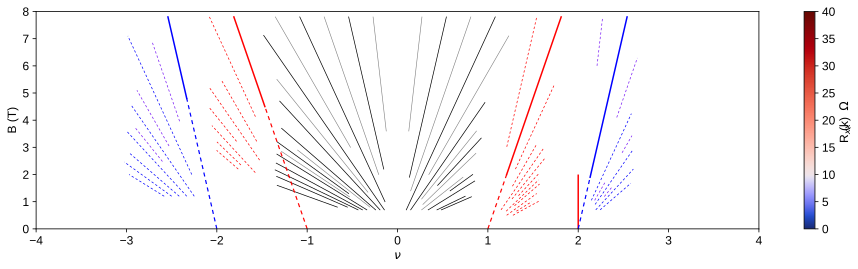

In [45]:
x = np.linspace(-4.5, 4.7, 1500)
y = np.linspace(0, 8, 600)
Rxxfanw3int = gaussian_filter(Rfanw3func(x, y).T, (1.2, 1.2))

fig, ax = plt.subplots(1, 1, figsize=(16.2, 4))
# p1 = ax.pcolormesh(x, y, Rxxfanw3int/1000, norm=TwoSlopeNorm(10, 0, 40), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(p1, ax=ax, label='R$_{xx}$ (k$\Omega$)')
ax.set_xlim(-4, 4)
ax.set_xlabel('$\\nu$')
ax.set_ylabel('B (T)')
# plt.savefig(figfile + 'W3_1p10_Fandiagramto8T.svg', dpi=300, bbox_inches='tight')

Vgatefull = 7.64
sl = 15.1
slfill = sl*Vgatefull/4

def plotline(slope, xintercept, Bl, Bs, *args, **kwargs):
    "Note that slope is actually 1/(actual slope)"
    b = -xintercept*slfill
    x = np.linspace((Bs*slope - b)/slfill, (Bl*slope - b)/slfill, 5)
    plt.plot(x, (x*slfill + b)/slope, *args, **kwargs)

# new set of lines
Bl = 7.8
Bs = 3.1
# LW = 1.3
dashes = (3.4, 3) #(6, 5)
bolddashes = (3.4, 3)

# CNP
slopes = [-24, -20, -18, -16, -14, -13, -12, -11, -10, -8, -7, -6, -5, -4, -3, -2, -1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 14, 18, 20]
Bl = [1.6, 1.93, 2.17, 2.42, 2.75, 2.85, 3.2, 2.9, 3.7, 4.7, 5.5, 7.12] + [7.8]*9 + [7.1, 4.65, 3.6, 3.34, 2.78, 1.90, 2, 1.76, 1.20, 1.18]
Bs = [0.8, 0.8, 0.7, 0.7, 0.7, 1.18, 1.3, 0.8, 0.7, 0.7, 1.35, 0.7, 3, 1, 2, 2.2, 3.6, 3.6, 1.9, 1.4, 0.7, 2, 0.7, 1.1, 1.6, 0.9, 0.7, 1.4, 0.7, 0.7, 0.7]
for i in range(len(slopes)):
    if slopes[i]%2 == 0:
        plotline(slopes[i], 0, Bl[i], Bs[i], lw=0.7, color='k')
    else:
        plotline(slopes[i], 0, Bl[i], Bs[i], lw=0.6, color='gray')

# nu = 1
slopes = [2, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16]
Bls = [7.8, 5.27, 3.1, 3, 2.6, 2.06, 1.8, 1.65, 1.3, 1, 1.02]
Bs = [3.02, 2.2, 1.57, 0.7, 1.1, 1.22, 0.65, 0.85, 0.5, 0.65, 0.5]
for i in range(len(slopes)):
    plotline(slopes[i], 1,  Bls[i], Bs[i], 'r', lw=0.7, dashes=dashes)

# nu = 2
slopes = [1, 3, 4, 5, 5, 6, 7, 8, 10]
Bls = [7.8, 6.29, 4.24, 1.7, 3.43, 2.93, 1.57, 2.2, 1.68]
Bs = [6, 4.1, 1.05, 1.05, 2.8, 0.9, 1.19, 0.7, 0.7]
for i in range(len(slopes)):
    if slopes[i]%2 == 0:
        plotline(slopes[i], 2, Bls[i],  Bs[i], 'b', lw=0.7, dashes=dashes)
    else:
        plotline(slopes[i], 2, Bls[i],  Bs[i], color='#7818f5', lw=0.7, dashes=dashes)
        
# nu = -2
slopes = [-3, -4, -5, -6, -7, -8, -10, -12, -14]
Bls = [6.86, 7.1, 5.1, 4.54, 3.76, 3.6, 2.8, 2.46, 2]
Bs = [3.96, 2, 3.05, 1.2, 2.48, 1.2, 1.2, 1.2, 1.2]
for i in range(len(slopes)):
    if slopes[i]%2 == 0:
        plotline(slopes[i], -2, Bls[i], Bs[i], color='b', lw=0.7, dashes=dashes)
    else:
        plotline(slopes[i], -2, Bls[i], Bs[i], color='#7818f5', lw=0.7, dashes=dashes)
    
# nu = -1
slopes = [-4, -5, -6, -7, -8, -9, -10]
Bls = [7.8, 5.5, 5.2, 4.5, 3.8, 3.2, 2.89]
Bs = [4.13, 3.22, 2.53, 3.22, 2.07, 2.35, 2.2]
for i in range(len(slopes)):
    plotline(slopes[i], -1, Bls[i], Bs[i], color='r', lw=0.7, dashes=dashes)

# Chern states
plotline(3, 1, 2, 0, lw=1.2, color='r', dashes=bolddashes)
plotline(3, 1, 7.8, 2, lw=1.5, color='r')
plotline(2, 2, 1.9, 0, lw=1.2, color='b', dashes=bolddashes)
plotline(2, 2, 7.8, 1.9, lw=1.5, color='b')
plotline(-2, -2, 4.8, 0, lw=1.2, color='b', dashes=bolddashes)
plotline(-2, -2, 7.8, 4.8, lw=1.5, color='b')
plotline(-3, -1, 4.5, 0, lw=1.2, color='r', dashes=bolddashes)
plotline(-3, -1, 7.8, 4.5, lw=1.5, color='r')
plt.vlines(2, 0, 2, lw=1.5, color='r')
# plt.axis(aaxis)
plt.ylim(0, 8)

# plt.savefig(figfile + 'W3_1p10deg_fandiagramto8T_lines.svg', dpi=300, bbox_inches='tight')

In [77]:
# aaxis = plt.axis()

## Extracting Chern insulator regions from Rxx (No Rxy for this device since the electrodes were bad)

In [83]:
x = np.linspace(-4.5, 4.7, 1500)
y = np.linspace(0, 8, 600)
Rxxfanw3int = gaussian_filter(Rfanw3func(x, y).T, (1.2, 1.2))

fig, ax = plt.subplots(1, 1, figsize=(11, 4.7))
p1 = ax.pcolormesh(x, y, Rxxfanw3int/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(4, 0, 40), rasterized=True)
plt.colorbar(p1, ax=ax, label='R$_{xx}$ (k$\Omega$)')
ax.set_xlim(-4, 4)
ax.set_xlabel('n/n$_0$')
ax.set_ylabel('B (T)')

V0 = 0
sl = 15.1
b = -sl*V0
Vgatefull = 7.640000000000001
slfill = sl*Vgatefull/4

Bl = 7.8
Bs = 0
LW = 0.7
# dashes = (6, 5)
# for i in [-14, -10, -8, -6, -4, -2, 2, 3, 4, 6, 8, 10]:
#     x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
#     plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=LW, dashes=dashes)
    
nuhalf = 1.99
b = -slfill*nuhalf
i = 2
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=LW, dashes=dashes)
    
nuhalfn= -1.97
b = -slfill*nuhalfn
i = -2
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=LW, dashes=dashes)

nuquart = 1
b = -slfill*nuquart
i = 3
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=LW, dashes=dashes)

nuquartn = -1
b = -slfill*nuquartn
i = -3
x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=LW, dashes=dashes)

plt.xlim(-4, 4)

/Users/robertpolski/anaconda/envs/qcodes/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

(-4, 4)

4.399999999999999
4.559999999999998
1.7999999999999996
1.6800000000000033


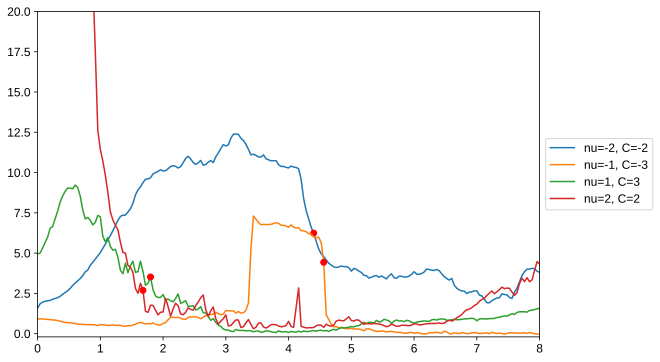

In [297]:
ymin, ymax = -0.2, 20
xmin, xmax = 0, 8

Bl = 8
Bs = 0

def linecut(nuint, slope):
    "put in the xintercept (in nu) and slope (integer corresponding to C)"
    b = -nuint*slfill
    i = slope
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 201)
    B = (x*slfill + b)/i
    cutRxx = np.zeros(len(B))
    for i in range(len(B)):
        cutRxx[i] = Rfanw3func(x[i], B[i])/1000
        
    return B, cutRxx # in kOhms

def cutoffB(B, cutRxx, dropoffval=2, beginning=-1):
    cutoff = 8
    indx = -1
    baseline = np.average(cutRxx[beginning-8:beginning])
    for i in range(len(B)):
        indx = beginning - i
        if (cutRxx[indx] - baseline) > dropoffval:
            cutoff = B[indx]
            break
    print(cutoff)
    return cutoff, indx

def plotcutoff(B, cut, label, dropoffval=2, beginning=-1):
    plt.plot(B, cut, label=label)
    cutoff, indx = cutoffB(B, cut, dropoffval=dropoffval, beginning=beginning)
    plt.plot(B[indx], cut[indx], 'or')

B1, cut1 = linecut(-2, -2)
B2, cut2 = linecut(-1, -3)
B3, cut3 = linecut(1, 3)
B4, cut4 = linecut(1.99, 2)

plt.figure(figsize=(9, 6))
plotcutoff(B1, cut1, label='nu=-2, C=-2')
plotcutoff(B2, cut2, label='nu=-1, C=-3')
plotcutoff(B3, cut3, label='nu=1, C=3')
plotcutoff(B4, cut4, label='nu=2, C=2', beginning=-100)
plt.ylim(ymin, ymax)
plt.xlim(xmin, xmax)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

## SdH oscillation region

In [204]:
np.interp([-2, -0.8], [V0 - Vgatefull*6/4, V0 + Vgatefull*6/4], [-6, 6])

array([-1.26701571, -0.63874346])

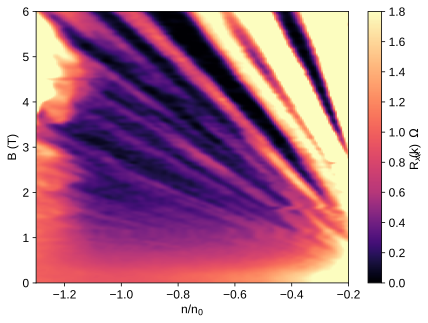

In [268]:
x = np.linspace(-4.5, 4.7, 1500)
y = np.linspace(0, 8, 600)
Rxxfanw3int = gaussian_filter(Rfanw3func(x, y).T, (1.2, 1.2))

fig, ax = plt.subplots(1, 1, figsize=(7, 5))
p1 = ax.pcolormesh(x, y, gaussian_filter(Rxxfanw3int/1000, (1, 1)), cmap='magma', norm=TwoSlopeNorm(0.6, 0, 1.8), rasterized=True)
plt.colorbar(p1, ax=ax, label='R$_{xx}$ (k$\Omega$)')
ax.set_xlim(-1.3, -0.2)
ax.set_ylim(0, 6)
ax.set_xlabel('n/n$_0$')
ax.set_ylabel('B (T)')
# plt.savefig(figfile + 'W3_1p10_Fandiagramto7T_smallrangeSdH.svg', dpi=300, bbox_inches='tight')

# M30--double-gated device--areas (Just at 0 electric field)

# Combining devices into phase diagram

## Using Rxy

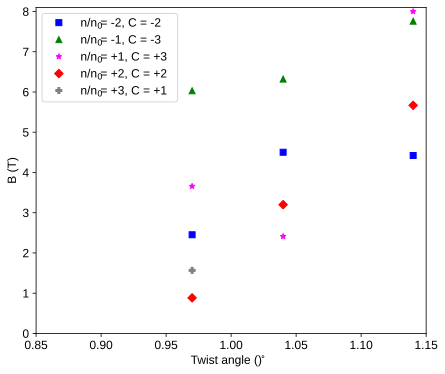

In [46]:
angles = [0.97]*5 + [1.04]*4 + [1.14]*4  # estimating 1.10 degrees by eye, at the moment. need more rigorous definitions, probably
fields =  [2.4522613065326624, 0.8844221105527659, 6.030150753768846, 3.6582914572864333, 1.5678391959799] + [4.502512562814072, 3.1999999999999993, 6.319999999999999, 2.412060301507536] + [4.422110552763822, 5.668341708542716, 7.758793969849244, 8.000000000000002]
markertype = ['s', 'D', '^', '*', 'P'] + ['s', 'D', '^', '*'] + ['s', 'D', '^', '*']
colors = ['blue', 'red', 'green', 'magenta', 'gray']
markermap = ['s', 'D', '^', '*', 'P']
""" Marker types with the associated filling factor, chern numbers (filling, C)
Diamond 'D': (+2, +2)
Square 's': (-2, -2)
Triangle '^': (-1, -3)
Star '*': (+1, +3)
Plus 'P': (+3, +1)"""

## 0.87 is approximate, and so is the 1.04 square (-2)
plt.figure(figsize=(7, 6))
for i in range(len(angles)):
    c = colors[markermap.index(markertype[i])]
    plt.plot(angles[i], fields[i], marker=markertype[i], color=c)
    
plt.xlim(0.85, 1.15)
plt.ylim(0, 8.1)
plt.xlabel('Twist angle ($^\circ$)')
plt.ylabel('B (T)')

lhandles = []
def populatelegend(markers, colors):
    for i in range(len(markers)):
        lhandles.append(Line2D([0], [0], marker=markers[i], color=colors[i], linewidth=0))
        
populatelegend(['s', '^', '*', 'D', 'P'], ['blue', 'green', 'magenta', 'red', 'gray'])
plt.legend(lhandles, ['n/n$_0$ = -2, C = -2', 'n/n$_0$ = -1, C = -3', 'n/n$_0$ = +1, C = +3', 'n/n$_0$ = +2, C = +2', 'n/n$_0$ = +3, C = +1'])

# plt.savefig(figfile + 'AllDevs_angleBdiagram_Rxy.svg', dpi=300, bbox_inches='tight')

## Using Rxx

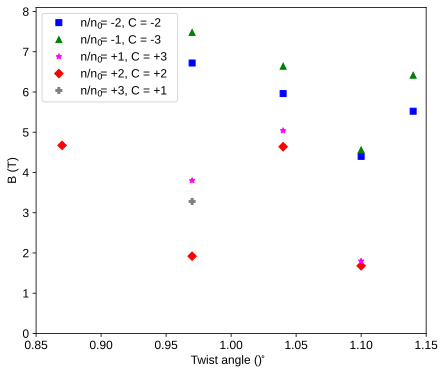

In [47]:
angles = [0.87] + [0.97]*5 + [1.04]*4 + [1.10]*4 + [1.14]*2  # estimating 1.10 degrees by eye, at the moment. need more rigorous definitions, probably
fields = [4.6733668341708565] + [6.720000000000002, 1.9200000000000017, 7.4799999999999995, 3.800000000000002, 3.280000000000001] + [5.959999999999997, 4.640000000000001, 6.64, 5.040000000000002] + [4.399999999999999, 1.6800000000000033, 4.559999999999998, 1.7999999999999996] + [5.522222222222222, 6.416666666666665]
markertype = ['D'] + ['s', 'D', '^', '*', 'P'] + ['s', 'D', '^', '*'] + ['s', 'D', '^', '*'] + ['s', '^']
colors = ['blue', 'red', 'green', 'magenta', 'gray']
markermap = ['s', 'D', '^', '*', 'P']
""" Marker types with the associated filling factor, chern numbers (filling, C)
Diamond 'D': (+2, +2)
Square 's': (-2, -2)
Triangle '^': (-1, -3)
Star '*': (+1, +3)
Plus 'P': (+3, +1)"""

## 0.87 is approximate, and so is the 1.04 square (-2)
plt.figure(figsize=(7, 6))
lines = []
for i in range(len(angles)):
    c = colors[markermap.index(markertype[i])]
    l = plt.plot(angles[i], fields[i], marker=markertype[i], color=c)
    lines.append(l)
    
plt.xlim(0.85, 1.15)
plt.ylim(0, 8.1)

plt.xlabel('Twist angle ($^\circ$)')
plt.ylabel('B (T)')

lhandles = []
def populatelegend(markers, colors):
    for i in range(len(markers)):
        lhandles.append(Line2D([0], [0], marker=markers[i], color=colors[i], linewidth=0))
        
populatelegend(['s', '^', '*', 'D', 'P'], ['blue', 'green', 'magenta', 'red', 'gray'])
plt.legend(lhandles, ['n/n$_0$ = -2, C = -2', 'n/n$_0$ = -1, C = -3', 'n/n$_0$ = +1, C = +3', 'n/n$_0$ = +2, C = +2', 'n/n$_0$ = +3, C = +1'])

# plt.savefig(figfile + 'AllDevs_angleBdiagram_Rxx.svg', dpi=300, bbox_inches='tight')